In [1]:
from __future__ import division
from __future__ import print_function
from __future__ import absolute_import
import random
import pprint
import sys
import time
import numpy as np
from optparse import OptionParser
import pickle
import math
import cv2
import copy
from matplotlib import pyplot as plt
import tensorflow as tf
import pandas as pd
import os

from sklearn.metrics import average_precision_score

from keras import backend as K
from keras.optimizers import Adam, SGD, RMSprop
from keras.layers import Flatten, Dense, Input, Conv2D, MaxPooling2D, Dropout
from keras.layers import GlobalAveragePooling2D, GlobalMaxPooling2D, TimeDistributed
from keras.engine.topology import get_source_inputs
from keras.utils import layer_utils
from keras.utils.data_utils import get_file
from keras.objectives import categorical_crossentropy

from keras.models import Model
from keras.utils import generic_utils
from keras.engine import Layer, InputSpec
from keras import initializers, regularizers

Using TensorFlow backend.


In [2]:
class Config:

	def __init__(self):

		# Print the process or not
		self.verbose = True

		# Name of base network
		self.network = 'vgg'

		# Setting for data augmentation
		self.use_horizontal_flips = False
		self.use_vertical_flips = False
		self.rot_90 = False

		# Anchor box scales
    # Note that if im_size is smaller, anchor_box_scales should be scaled
    # Original anchor_box_scales in the paper is [128, 256, 512]
		self.anchor_box_scales = [64, 128, 256] 

		# Anchor box ratios
		self.anchor_box_ratios = [[1, 1], [1./math.sqrt(2), 2./math.sqrt(2)], [2./math.sqrt(2), 1./math.sqrt(2)]]

		# Size to resize the smallest side of the image
		# Original setting in paper is 600. Set to 300 in here to save training time
		self.im_size = 300

		# image channel-wise mean to subtract
		self.img_channel_mean = [103.939, 116.779, 123.68]
		self.img_scaling_factor = 1.0

		# number of ROIs at once
		self.num_rois = 4

		# stride at the RPN (this depends on the network configuration)
		self.rpn_stride = 16

		self.balanced_classes = False

		# scaling the stdev
		self.std_scaling = 4.0
		self.classifier_regr_std = [8.0, 8.0, 4.0, 4.0]

		# overlaps for RPN
		self.rpn_min_overlap = 0.3
		self.rpn_max_overlap = 0.7

		# overlaps for classifier ROIs
		self.classifier_min_overlap = 0.1
		self.classifier_max_overlap = 0.5

		# placeholder for the class mapping, automatically generated by the parser
		self.class_mapping = None

		self.model_path = None

In [3]:
def get_data(input_path):
	"""Parser the data from annotation file
	
	Args:
		input_path: annotation file path

	Returns:
		all_data: list(filepath, width, height, list(bboxes))
		classes_count: dict{key:class_name, value:count_num} 
			e.g. {'Car': 2383, 'Mobile phone': 1108, 'Person': 3745}
		class_mapping: dict{key:class_name, value: idx}
			e.g. {'Car': 0, 'Mobile phone': 1, 'Person': 2}
	"""
	found_bg = False
	all_imgs = {}

	classes_count = {}

	class_mapping = {}

	visualise = True

	i = 1
	
	with open(input_path,'r') as f:

		print('Parsing annotation files')

		for line in f:

			# Print process
			sys.stdout.write('\r'+'idx=' + str(i))
			i += 1

			line_split = line.strip().split(',')

			# Make sure the info saved in annotation file matching the format (path_filename, x1, y1, x2, y2, class_name)
			# Note:
			#	One path_filename might has several classes (class_name)
			#	x1, y1, x2, y2 are the pixel value of the origial image, not the ratio value
			#	(x1, y1) top left coordinates; (x2, y2) bottom right coordinates
			#   x1,y1-------------------
			#	|						|
			#	|						|
			#	|						|
			#	|						|
			#	---------------------x2,y2

			(filename,x1,y1,x2,y2,class_name) = line_split

			if class_name not in classes_count:
				classes_count[class_name] = 1
			else:
				classes_count[class_name] += 1

			if class_name not in class_mapping:
				if class_name == 'bg' and found_bg == False:
					print('Found class name with special name bg. Will be treated as a background region (this is usually for hard negative mining).')
					found_bg = True
				class_mapping[class_name] = len(class_mapping)

			if filename not in all_imgs:
				all_imgs[filename] = {}
				
				img = cv2.imread(filename)
				(rows,cols) = img.shape[:2]
				all_imgs[filename]['filepath'] = filename
				all_imgs[filename]['width'] = cols
				all_imgs[filename]['height'] = rows
				all_imgs[filename]['bboxes'] = []
				# if np.random.randint(0,6) > 0:
				# 	all_imgs[filename]['imageset'] = 'trainval'
				# else:
				# 	all_imgs[filename]['imageset'] = 'test'

			all_imgs[filename]['bboxes'].append({'class': class_name, 'x1': int(x1), 'x2': int(x2), 'y1': int(y1), 'y2': int(y2)})


		all_data = []
		for key in all_imgs:
			all_data.append(all_imgs[key])
		
		# make sure the bg class is last in the list
		if found_bg:
			if class_mapping['bg'] != len(class_mapping) - 1:
				key_to_switch = [key for key in class_mapping.keys() if class_mapping[key] == len(class_mapping)-1][0]
				val_to_switch = class_mapping['bg']
				class_mapping['bg'] = len(class_mapping) - 1
				class_mapping[key_to_switch] = val_to_switch
		
		return all_data, classes_count, class_mapping

In [4]:
class RoiPoolingConv(Layer):
    '''ROI pooling layer for 2D inputs.
    See Spatial Pyramid Pooling in Deep Convolutional Networks for Visual Recognition,
    K. He, X. Zhang, S. Ren, J. Sun
    # Arguments
        pool_size: int
            Size of pooling region to use. pool_size = 7 will result in a 7x7 region.
        num_rois: number of regions of interest to be used
    # Input shape
        list of two 4D tensors [X_img,X_roi] with shape:
        X_img:
        `(1, rows, cols, channels)`
        X_roi:
        `(1,num_rois,4)` list of rois, with ordering (x,y,w,h)
    # Output shape
        3D tensor with shape:
        `(1, num_rois, channels, pool_size, pool_size)`
    '''
    def __init__(self, pool_size, num_rois, **kwargs):

        self.dim_ordering =  K.common.image_dim_ordering()
        self.pool_size = pool_size
        self.num_rois = num_rois

        super(RoiPoolingConv, self).__init__(**kwargs)

    def build(self, input_shape):
        self.nb_channels = input_shape[0][3]   

    def compute_output_shape(self, input_shape):
        return None, self.num_rois, self.pool_size, self.pool_size, self.nb_channels

    def call(self, x, mask=None):

        assert(len(x) == 2)

        # x[0] is image with shape (rows, cols, channels)
        img = x[0]

        # x[1] is roi with shape (num_rois,4) with ordering (x,y,w,h)
        rois = x[1]

        input_shape = K.shape(img)

        outputs = []

        for roi_idx in range(self.num_rois):

            x = rois[0, roi_idx, 0]
            y = rois[0, roi_idx, 1]
            w = rois[0, roi_idx, 2]
            h = rois[0, roi_idx, 3]

            x = K.cast(x, 'int32')
            y = K.cast(y, 'int32')
            w = K.cast(w, 'int32')
            h = K.cast(h, 'int32')

            # Resized roi of the image to pooling size (7x7)
            rs = tf.image.resize(img[:, y:y+h, x:x+w, :], (self.pool_size, self.pool_size))
            outputs.append(rs)
                

        final_output = K.concatenate(outputs, axis=0)

        # Reshape to (1, num_rois, pool_size, pool_size, nb_channels)
        # Might be (1, 4, 7, 7, 3)
        final_output = K.reshape(final_output, (1, self.num_rois, self.pool_size, self.pool_size, self.nb_channels))

        # permute_dimensions is similar to transpose
        final_output = K.permute_dimensions(final_output, (0, 1, 2, 3, 4))

        return final_output
    
    
    def get_config(self):
        config = {'pool_size': self.pool_size,
                  'num_rois': self.num_rois}
        base_config = super(RoiPoolingConv, self).get_config()
        return dict(list(base_config.items()) + list(config.items()))

In [5]:
def get_img_output_length(width, height):
    def get_output_length(input_length):
        return input_length//16

    return get_output_length(width), get_output_length(height)    

def nn_base(input_tensor=None, trainable=False):


    input_shape = (None, None, 3)

    if input_tensor is None:
        img_input = Input(shape=input_shape)
    else:
        if not K.is_keras_tensor(input_tensor):
            img_input = Input(tensor=input_tensor, shape=input_shape)
        else:
            img_input = input_tensor

    bn_axis = 3

    # Block 1
    x = Conv2D(64, (3, 3), activation='relu', padding='same', name='block1_conv1')(img_input)
    x = Conv2D(64, (3, 3), activation='relu', padding='same', name='block1_conv2')(x)
    x = MaxPooling2D((2, 2), strides=(2, 2), name='block1_pool')(x)

    # Block 2
    x = Conv2D(128, (3, 3), activation='relu', padding='same', name='block2_conv1')(x)
    x = Conv2D(128, (3, 3), activation='relu', padding='same', name='block2_conv2')(x)
    x = MaxPooling2D((2, 2), strides=(2, 2), name='block2_pool')(x)

    # Block 3
    x = Conv2D(256, (3, 3), activation='relu', padding='same', name='block3_conv1')(x)
    x = Conv2D(256, (3, 3), activation='relu', padding='same', name='block3_conv2')(x)
    x = Conv2D(256, (3, 3), activation='relu', padding='same', name='block3_conv3')(x)
    x = MaxPooling2D((2, 2), strides=(2, 2), name='block3_pool')(x)

    # Block 4
    x = Conv2D(512, (3, 3), activation='relu', padding='same', name='block4_conv1')(x)
    x = Conv2D(512, (3, 3), activation='relu', padding='same', name='block4_conv2')(x)
    x = Conv2D(512, (3, 3), activation='relu', padding='same', name='block4_conv3')(x)
    x = MaxPooling2D((2, 2), strides=(2, 2), name='block4_pool')(x)

    # Block 5
    x = Conv2D(512, (3, 3), activation='relu', padding='same', name='block5_conv1')(x)
    x = Conv2D(512, (3, 3), activation='relu', padding='same', name='block5_conv2')(x)
    x = Conv2D(512, (3, 3), activation='relu', padding='same', name='block5_conv3')(x)
    # x = MaxPooling2D((2, 2), strides=(2, 2), name='block5_pool')(x)

    return x

In [6]:
def rpn_layer(base_layers, num_anchors):
    """Create a rpn layer
        Step1: Pass through the feature map from base layer to a 3x3 512 channels convolutional layer
                Keep the padding 'same' to preserve the feature map's size
        Step2: Pass the step1 to two (1,1) convolutional layer to replace the fully connected layer
                classification layer: num_anchors (9 in here) channels for 0, 1 sigmoid activation output
                regression layer: num_anchors*4 (36 in here) channels for computing the regression of bboxes with linear activation
    Args:
        base_layers: vgg in here
        num_anchors: 9 in here

    Returns:
        [x_class, x_regr, base_layers]
        x_class: classification for whether it's an object
        x_regr: bboxes regression
        base_layers: vgg in here
    """
    x = Conv2D(512, (3, 3), padding='same', activation='relu', kernel_initializer='normal', name='rpn_conv1')(base_layers)

    x_class = Conv2D(num_anchors, (1, 1), activation='sigmoid', kernel_initializer='uniform', name='rpn_out_class')(x)
    x_regr = Conv2D(num_anchors * 4, (1, 1), activation='linear', kernel_initializer='zero', name='rpn_out_regress')(x)

    return [x_class, x_regr, base_layers]

In [7]:
def classifier_layer(base_layers, input_rois, num_rois, nb_classes = 4):
    """Create a classifier layer
    
    Args:
        base_layers: vgg
        input_rois: `(1,num_rois,4)` list of rois, with ordering (x,y,w,h)
        num_rois: number of rois to be processed in one time (4 in here)

    Returns:
        list(out_class, out_regr)
        out_class: classifier layer output
        out_regr: regression layer output
    """

    input_shape = (num_rois,7,7,512)

    pooling_regions = 7

    # out_roi_pool.shape = (1, num_rois, channels, pool_size, pool_size)
    # num_rois (4) 7x7 roi pooling
    out_roi_pool = RoiPoolingConv(pooling_regions, num_rois)([base_layers, input_rois])

    # Flatten the convlutional layer and connected to 2 FC and 2 dropout
    out = TimeDistributed(Flatten(name='flatten'))(out_roi_pool)
    out = TimeDistributed(Dense(4096, activation='relu', name='fc1'))(out)
    out = TimeDistributed(Dropout(0.5))(out)
    out = TimeDistributed(Dense(4096, activation='relu', name='fc2'))(out)
    out = TimeDistributed(Dropout(0.5))(out)

    # There are two output layer
    # out_class: softmax acivation function for classify the class name of the object
    # out_regr: linear activation function for bboxes coordinates regression
    out_class = TimeDistributed(Dense(nb_classes, activation='softmax', kernel_initializer='zero'), name='dense_class_{}'.format(nb_classes))(out)
    # note: no regression target for bg class
    out_regr = TimeDistributed(Dense(4 * (nb_classes-1), activation='linear', kernel_initializer='zero'), name='dense_regress_{}'.format(nb_classes))(out)

    return [out_class, out_regr]

In [8]:
def union(au, bu, area_intersection):
	area_a = (au[2] - au[0]) * (au[3] - au[1])
	area_b = (bu[2] - bu[0]) * (bu[3] - bu[1])
	area_union = area_a + area_b - area_intersection
	return area_union


def intersection(ai, bi):
	x = max(ai[0], bi[0])
	y = max(ai[1], bi[1])
	w = min(ai[2], bi[2]) - x
	h = min(ai[3], bi[3]) - y
	if w < 0 or h < 0:
		return 0
	return w*h


def iou(a, b):
	# a and b should be (x1,y1,x2,y2)

	if a[0] >= a[2] or a[1] >= a[3] or b[0] >= b[2] or b[1] >= b[3]:
		return 0.0

	area_i = intersection(a, b)
	area_u = union(a, b, area_i)

	return float(area_i) / float(area_u + 1e-6)

In [9]:
def calc_rpn(C, img_data, width, height, resized_width, resized_height, img_length_calc_function):
	"""(Important part!) Calculate the rpn for all anchors 
		If feature map has shape 38x50=1900, there are 1900x9=17100 potential anchors
	
	Args:
		C: config
		img_data: augmented image data
		width: original image width (e.g. 600)
		height: original image height (e.g. 800)
		resized_width: resized image width according to C.im_size (e.g. 300)
		resized_height: resized image height according to C.im_size (e.g. 400)
		img_length_calc_function: function to calculate final layer's feature map (of base model) size according to input image size

	Returns:
		y_rpn_cls: list(num_bboxes, y_is_box_valid + y_rpn_overlap)
			y_is_box_valid: 0 or 1 (0 means the box is invalid, 1 means the box is valid)
			y_rpn_overlap: 0 or 1 (0 means the box is not an object, 1 means the box is an object)
		y_rpn_regr: list(num_bboxes, 4*y_rpn_overlap + y_rpn_regr)
			y_rpn_regr: x1,y1,x2,y2 bunding boxes coordinates
	"""
	downscale = float(C.rpn_stride) 
	anchor_sizes = C.anchor_box_scales   # 128, 256, 512
	anchor_ratios = C.anchor_box_ratios  # 1:1, 1:2*sqrt(2), 2*sqrt(2):1
	num_anchors = len(anchor_sizes) * len(anchor_ratios) # 3x3=9

	# calculate the output map size based on the network architecture
	(output_width, output_height) = img_length_calc_function(resized_width, resized_height)

	n_anchratios = len(anchor_ratios)    # 3
	
	# initialise empty output objectives
	y_rpn_overlap = np.zeros((output_height, output_width, num_anchors))
	y_is_box_valid = np.zeros((output_height, output_width, num_anchors))
	y_rpn_regr = np.zeros((output_height, output_width, num_anchors * 4))

	num_bboxes = len(img_data['bboxes'])

	num_anchors_for_bbox = np.zeros(num_bboxes).astype(int)
	best_anchor_for_bbox = -1*np.ones((num_bboxes, 4)).astype(int)
	best_iou_for_bbox = np.zeros(num_bboxes).astype(np.float32)
	best_x_for_bbox = np.zeros((num_bboxes, 4)).astype(int)
	best_dx_for_bbox = np.zeros((num_bboxes, 4)).astype(np.float32)

	# get the GT box coordinates, and resize to account for image resizing
	gta = np.zeros((num_bboxes, 4))
	for bbox_num, bbox in enumerate(img_data['bboxes']):
		# get the GT box coordinates, and resize to account for image resizing
		gta[bbox_num, 0] = bbox['x1'] * (resized_width / float(width))
		gta[bbox_num, 1] = bbox['x2'] * (resized_width / float(width))
		gta[bbox_num, 2] = bbox['y1'] * (resized_height / float(height))
		gta[bbox_num, 3] = bbox['y2'] * (resized_height / float(height))
	
	# rpn ground truth

	for anchor_size_idx in range(len(anchor_sizes)):
		for anchor_ratio_idx in range(n_anchratios):
			anchor_x = anchor_sizes[anchor_size_idx] * anchor_ratios[anchor_ratio_idx][0]
			anchor_y = anchor_sizes[anchor_size_idx] * anchor_ratios[anchor_ratio_idx][1]	
			
			for ix in range(output_width):					
				# x-coordinates of the current anchor box	
				x1_anc = downscale * (ix + 0.5) - anchor_x / 2
				x2_anc = downscale * (ix + 0.5) + anchor_x / 2	
				
				# ignore boxes that go across image boundaries					
				if x1_anc < 0 or x2_anc > resized_width:
					continue
					
				for jy in range(output_height):

					# y-coordinates of the current anchor box
					y1_anc = downscale * (jy + 0.5) - anchor_y / 2
					y2_anc = downscale * (jy + 0.5) + anchor_y / 2

					# ignore boxes that go across image boundaries
					if y1_anc < 0 or y2_anc > resized_height:
						continue

					# bbox_type indicates whether an anchor should be a target
					# Initialize with 'negative'
					bbox_type = 'neg'

					# this is the best IOU for the (x,y) coord and the current anchor
					# note that this is different from the best IOU for a GT bbox
					best_iou_for_loc = 0.0

					for bbox_num in range(num_bboxes):
						
						# get IOU of the current GT box and the current anchor box
						curr_iou = iou([gta[bbox_num, 0], gta[bbox_num, 2], gta[bbox_num, 1], gta[bbox_num, 3]], [x1_anc, y1_anc, x2_anc, y2_anc])
						# calculate the regression targets if they will be needed
						if curr_iou > best_iou_for_bbox[bbox_num] or curr_iou > C.rpn_max_overlap:
							cx = (gta[bbox_num, 0] + gta[bbox_num, 1]) / 2.0
							cy = (gta[bbox_num, 2] + gta[bbox_num, 3]) / 2.0
							cxa = (x1_anc + x2_anc)/2.0
							cya = (y1_anc + y2_anc)/2.0

							# x,y are the center point of ground-truth bbox
							# xa,ya are the center point of anchor bbox (xa=downscale * (ix + 0.5); ya=downscale * (iy+0.5))
							# w,h are the width and height of ground-truth bbox
							# wa,ha are the width and height of anchor bboxe
							# tx = (x - xa) / wa
							# ty = (y - ya) / ha
							# tw = log(w / wa)
							# th = log(h / ha)
							tx = (cx - cxa) / (x2_anc - x1_anc)
							ty = (cy - cya) / (y2_anc - y1_anc)
							tw = np.log((gta[bbox_num, 1] - gta[bbox_num, 0]) / (x2_anc - x1_anc))
							th = np.log((gta[bbox_num, 3] - gta[bbox_num, 2]) / (y2_anc - y1_anc))
						
						if img_data['bboxes'][bbox_num]['class'] != 'bg':

							# all GT boxes should be mapped to an anchor box, so we keep track of which anchor box was best
							if curr_iou > best_iou_for_bbox[bbox_num]:
								best_anchor_for_bbox[bbox_num] = [jy, ix, anchor_ratio_idx, anchor_size_idx]
								best_iou_for_bbox[bbox_num] = curr_iou
								best_x_for_bbox[bbox_num,:] = [x1_anc, x2_anc, y1_anc, y2_anc]
								best_dx_for_bbox[bbox_num,:] = [tx, ty, tw, th]

							# we set the anchor to positive if the IOU is >0.7 (it does not matter if there was another better box, it just indicates overlap)
							if curr_iou > C.rpn_max_overlap:
								bbox_type = 'pos'
								num_anchors_for_bbox[bbox_num] += 1
								# we update the regression layer target if this IOU is the best for the current (x,y) and anchor position
								if curr_iou > best_iou_for_loc:
									best_iou_for_loc = curr_iou
									best_regr = (tx, ty, tw, th)

							# if the IOU is >0.3 and <0.7, it is ambiguous and no included in the objective
							if C.rpn_min_overlap < curr_iou < C.rpn_max_overlap:
								# gray zone between neg and pos
								if bbox_type != 'pos':
									bbox_type = 'neutral'

					# turn on or off outputs depending on IOUs
					if bbox_type == 'neg':
						y_is_box_valid[jy, ix, anchor_ratio_idx + n_anchratios * anchor_size_idx] = 1
						y_rpn_overlap[jy, ix, anchor_ratio_idx + n_anchratios * anchor_size_idx] = 0
					elif bbox_type == 'neutral':
						y_is_box_valid[jy, ix, anchor_ratio_idx + n_anchratios * anchor_size_idx] = 0
						y_rpn_overlap[jy, ix, anchor_ratio_idx + n_anchratios * anchor_size_idx] = 0
					elif bbox_type == 'pos':
						y_is_box_valid[jy, ix, anchor_ratio_idx + n_anchratios * anchor_size_idx] = 1
						y_rpn_overlap[jy, ix, anchor_ratio_idx + n_anchratios * anchor_size_idx] = 1
						start = 4 * (anchor_ratio_idx + n_anchratios * anchor_size_idx)
						y_rpn_regr[jy, ix, start:start+4] = best_regr

	# we ensure that every bbox has at least one positive RPN region

	for idx in range(num_anchors_for_bbox.shape[0]):
		if num_anchors_for_bbox[idx] == 0:
			# no box with an IOU greater than zero ...
			if best_anchor_for_bbox[idx, 0] == -1:
				continue
			y_is_box_valid[
				best_anchor_for_bbox[idx,0], best_anchor_for_bbox[idx,1], best_anchor_for_bbox[idx,2] + n_anchratios *
				best_anchor_for_bbox[idx,3]] = 1
			y_rpn_overlap[
				best_anchor_for_bbox[idx,0], best_anchor_for_bbox[idx,1], best_anchor_for_bbox[idx,2] + n_anchratios *
				best_anchor_for_bbox[idx,3]] = 1
			start = 4 * (best_anchor_for_bbox[idx,2] + n_anchratios * best_anchor_for_bbox[idx,3])
			y_rpn_regr[
				best_anchor_for_bbox[idx,0], best_anchor_for_bbox[idx,1], start:start+4] = best_dx_for_bbox[idx, :]

	y_rpn_overlap = np.transpose(y_rpn_overlap, (2, 0, 1))
	y_rpn_overlap = np.expand_dims(y_rpn_overlap, axis=0)

	y_is_box_valid = np.transpose(y_is_box_valid, (2, 0, 1))
	y_is_box_valid = np.expand_dims(y_is_box_valid, axis=0)

	y_rpn_regr = np.transpose(y_rpn_regr, (2, 0, 1))
	y_rpn_regr = np.expand_dims(y_rpn_regr, axis=0)

	pos_locs = np.where(np.logical_and(y_rpn_overlap[0, :, :, :] == 1, y_is_box_valid[0, :, :, :] == 1))
	neg_locs = np.where(np.logical_and(y_rpn_overlap[0, :, :, :] == 0, y_is_box_valid[0, :, :, :] == 1))

	num_pos = len(pos_locs[0])

	# one issue is that the RPN has many more negative than positive regions, so we turn off some of the negative
	# regions. We also limit it to 256 regions.
	num_regions = 256

	if len(pos_locs[0]) > num_regions/2:
		val_locs = random.sample(range(len(pos_locs[0])), len(pos_locs[0]) - num_regions/2)
		y_is_box_valid[0, pos_locs[0][val_locs], pos_locs[1][val_locs], pos_locs[2][val_locs]] = 0
		num_pos = num_regions/2

	if len(neg_locs[0]) + num_pos > num_regions:
		val_locs = random.sample(range(len(neg_locs[0])), len(neg_locs[0]) - num_pos)
		y_is_box_valid[0, neg_locs[0][val_locs], neg_locs[1][val_locs], neg_locs[2][val_locs]] = 0

	y_rpn_cls = np.concatenate([y_is_box_valid, y_rpn_overlap], axis=1)
	y_rpn_regr = np.concatenate([np.repeat(y_rpn_overlap, 4, axis=1), y_rpn_regr], axis=1)

	return np.copy(y_rpn_cls), np.copy(y_rpn_regr), num_pos

In [10]:
def get_new_img_size(width, height, img_min_side=300):
	if width <= height:
		f = float(img_min_side) / width
		resized_height = int(f * height)
		resized_width = img_min_side
	else:
		f = float(img_min_side) / height
		resized_width = int(f * width)
		resized_height = img_min_side

	return resized_width, resized_height

def augment(img_data, config, augment=True):
	assert 'filepath' in img_data
	assert 'bboxes' in img_data
	assert 'width' in img_data
	assert 'height' in img_data

	img_data_aug = copy.deepcopy(img_data)

	img = cv2.imread(img_data_aug['filepath'])

	if augment:
		rows, cols = img.shape[:2]

		if config.use_horizontal_flips and np.random.randint(0, 2) == 0:
			img = cv2.flip(img, 1)
			for bbox in img_data_aug['bboxes']:
				x1 = bbox['x1']
				x2 = bbox['x2']
				bbox['x2'] = cols - x1
				bbox['x1'] = cols - x2

		if config.use_vertical_flips and np.random.randint(0, 2) == 0:
			img = cv2.flip(img, 0)
			for bbox in img_data_aug['bboxes']:
				y1 = bbox['y1']
				y2 = bbox['y2']
				bbox['y2'] = rows - y1
				bbox['y1'] = rows - y2

		if config.rot_90:
			angle = np.random.choice([0,90,180,270],1)[0]
			if angle == 270:
				img = np.transpose(img, (1,0,2))
				img = cv2.flip(img, 0)
			elif angle == 180:
				img = cv2.flip(img, -1)
			elif angle == 90:
				img = np.transpose(img, (1,0,2))
				img = cv2.flip(img, 1)
			elif angle == 0:
				pass

			for bbox in img_data_aug['bboxes']:
				x1 = bbox['x1']
				x2 = bbox['x2']
				y1 = bbox['y1']
				y2 = bbox['y2']
				if angle == 270:
					bbox['x1'] = y1
					bbox['x2'] = y2
					bbox['y1'] = cols - x2
					bbox['y2'] = cols - x1
				elif angle == 180:
					bbox['x2'] = cols - x1
					bbox['x1'] = cols - x2
					bbox['y2'] = rows - y1
					bbox['y1'] = rows - y2
				elif angle == 90:
					bbox['x1'] = rows - y2
					bbox['x2'] = rows - y1
					bbox['y1'] = x1
					bbox['y2'] = x2        
				elif angle == 0:
					pass

	img_data_aug['width'] = img.shape[1]
	img_data_aug['height'] = img.shape[0]
	return img_data_aug, img

In [11]:
def get_anchor_gt(all_img_data, C, img_length_calc_function, mode='train'):
	""" Yield the ground-truth anchors as Y (labels)
		
	Args:
		all_img_data: list(filepath, width, height, list(bboxes))
		C: config
		img_length_calc_function: function to calculate final layer's feature map (of base model) size according to input image size
		mode: 'train' or 'test'; 'train' mode need augmentation

	Returns:
		x_img: image data after resized and scaling (smallest size = 300px)
		Y: [y_rpn_cls, y_rpn_regr]
		img_data_aug: augmented image data (original image with augmentation)
		debug_img: show image for debug
		num_pos: show number of positive anchors for debug
	"""
	while True:

		for img_data in all_img_data:
			try:

				# read in image, and optionally add augmentation

				if mode == 'train':
					img_data_aug, x_img = augment(img_data, C, augment=True)
				else:
					img_data_aug, x_img = augment(img_data, C, augment=False)

				(width, height) = (img_data_aug['width'], img_data_aug['height'])
				(rows, cols, _) = x_img.shape

				assert cols == width
				assert rows == height

				# get image dimensions for resizing
				(resized_width, resized_height) = get_new_img_size(width, height, C.im_size)

				# resize the image so that smalles side is length = 300px
				x_img = cv2.resize(x_img, (resized_width, resized_height), interpolation=cv2.INTER_CUBIC)
				debug_img = x_img.copy()

				try:
					y_rpn_cls, y_rpn_regr, num_pos = calc_rpn(C, img_data_aug, width, height, resized_width, resized_height, img_length_calc_function)
				except:
					continue

				# Zero-center by mean pixel, and preprocess image

				x_img = x_img[:,:, (2, 1, 0)]  # BGR -> RGB
				x_img = x_img.astype(np.float32)
				x_img[:, :, 0] -= C.img_channel_mean[0]
				x_img[:, :, 1] -= C.img_channel_mean[1]
				x_img[:, :, 2] -= C.img_channel_mean[2]
				x_img /= C.img_scaling_factor

				x_img = np.transpose(x_img, (2, 0, 1))
				x_img = np.expand_dims(x_img, axis=0)

				y_rpn_regr[:, y_rpn_regr.shape[1]//2:, :, :] *= C.std_scaling

				x_img = np.transpose(x_img, (0, 2, 3, 1))
				y_rpn_cls = np.transpose(y_rpn_cls, (0, 2, 3, 1))
				y_rpn_regr = np.transpose(y_rpn_regr, (0, 2, 3, 1))

				yield np.copy(x_img), [np.copy(y_rpn_cls), np.copy(y_rpn_regr)], img_data_aug, debug_img, num_pos

			except Exception as e:
				print(e)
				continue

In [12]:
def non_max_suppression_fast(boxes, probs, overlap_thresh=0.9, max_boxes=300):
	# code used from here: http://www.pyimagesearch.com/2015/02/16/faster-non-maximum-suppression-python/
	# if there are no boxes, return an empty list
  
    # Process explanation:
    #   Step 1: Sort the probs list
    #   Step 2: Find the larget prob 'Last' in the list and save it to the pick list
    #   Step 3: Calculate the IoU with 'Last' box and other boxes in the list. If the IoU is larger than overlap_threshold, delete the box from list
    #   Step 4: Repeat step 2 and step 3 until there is no item in the probs list 
	if len(boxes) == 0:
		return []

	# grab the coordinates of the bounding boxes
	x1 = boxes[:, 0]
	y1 = boxes[:, 1]
	x2 = boxes[:, 2]
	y2 = boxes[:, 3]

	np.testing.assert_array_less(x1, x2)
	np.testing.assert_array_less(y1, y2)

	# if the bounding boxes integers, convert them to floats --
	# this is important since we'll be doing a bunch of divisions
	if boxes.dtype.kind == "i":
		boxes = boxes.astype("float")

	# initialize the list of picked indexes	
	pick = []

	# calculate the areas
	area = (x2 - x1) * (y2 - y1)

	# sort the bounding boxes 
	idxs = np.argsort(probs)

	# keep looping while some indexes still remain in the indexes
	# list
	while len(idxs) > 0:
		# grab the last index in the indexes list and add the
		# index value to the list of picked indexes
		last = len(idxs) - 1
		i = idxs[last]
		pick.append(i)

		# find the intersection

		xx1_int = np.maximum(x1[i], x1[idxs[:last]])
		yy1_int = np.maximum(y1[i], y1[idxs[:last]])
		xx2_int = np.minimum(x2[i], x2[idxs[:last]])
		yy2_int = np.minimum(y2[i], y2[idxs[:last]])

		ww_int = np.maximum(0, xx2_int - xx1_int)
		hh_int = np.maximum(0, yy2_int - yy1_int)

		area_int = ww_int * hh_int

		# find the union
		area_union = area[i] + area[idxs[:last]] - area_int

		# compute the ratio of overlap
		overlap = area_int/(area_union + 1e-6)

		# delete all indexes from the index list that have
		idxs = np.delete(idxs, np.concatenate(([last],
			np.where(overlap > overlap_thresh)[0])))

		if len(pick) >= max_boxes:
			break

	# return only the bounding boxes that were picked using the integer data type
	boxes = boxes[pick].astype("int")
	probs = probs[pick]
	return boxes, probs

def apply_regr_np(X, T):
	"""Apply regression layer to all anchors in one feature map

	Args:
		X: shape=(4, 18, 25) the current anchor type for all points in the feature map
		T: regression layer shape=(4, 18, 25)

	Returns:
		X: regressed position and size for current anchor
	"""
	try:
		x = X[0, :, :]
		y = X[1, :, :]
		w = X[2, :, :]
		h = X[3, :, :]

		tx = T[0, :, :]
		ty = T[1, :, :]
		tw = T[2, :, :]
		th = T[3, :, :]

		cx = x + w/2.
		cy = y + h/2.
		cx1 = tx * w + cx
		cy1 = ty * h + cy

		w1 = np.exp(tw.astype(np.float64)) * w
		h1 = np.exp(th.astype(np.float64)) * h
		x1 = cx1 - w1/2.
		y1 = cy1 - h1/2.

		x1 = np.round(x1)
		y1 = np.round(y1)
		w1 = np.round(w1)
		h1 = np.round(h1)
		return np.stack([x1, y1, w1, h1])
	except Exception as e:
		print(e)
		return X
    
def apply_regr(x, y, w, h, tx, ty, tw, th):
    # Apply regression to x, y, w and h
	try:
		cx = x + w/2.
		cy = y + h/2.
		cx1 = tx * w + cx
		cy1 = ty * h + cy
		w1 = math.exp(tw) * w
		h1 = math.exp(th) * h
		x1 = cx1 - w1/2.
		y1 = cy1 - h1/2.
		x1 = int(round(x1))
		y1 = int(round(y1))
		w1 = int(round(w1))
		h1 = int(round(h1))

		return x1, y1, w1, h1

	except ValueError:
		return x, y, w, h
	except OverflowError:
		return x, y, w, h
	except Exception as e:
		print(e)
		return x, y, w, h

In [13]:
def rpn_to_roi(rpn_layer, regr_layer, C, dim_ordering, use_regr=True, max_boxes=300,overlap_thresh=0.9):
	"""Convert rpn layer to roi bboxes

	Args: (num_anchors = 9)
		rpn_layer: output layer for rpn classification 
			shape (1, feature_map.height, feature_map.width, num_anchors)
			Might be (1, 18, 25, 9) if resized image is 400 width and 300
		regr_layer: output layer for rpn regression
			shape (1, feature_map.height, feature_map.width, num_anchors)
			Might be (1, 18, 25, 36) if resized image is 400 width and 300
		C: config
		use_regr: Wether to use bboxes regression in rpn
		max_boxes: max bboxes number for non-max-suppression (NMS)
		overlap_thresh: If iou in NMS is larger than this threshold, drop the box

	Returns:
		result: boxes from non-max-suppression (shape=(300, 4))
			boxes: coordinates for bboxes (on the feature map)
	"""
	regr_layer = regr_layer / C.std_scaling

	anchor_sizes = C.anchor_box_scales   # (3 in here)
	anchor_ratios = C.anchor_box_ratios  # (3 in here)

	assert rpn_layer.shape[0] == 1

	(rows, cols) = rpn_layer.shape[1:3]

	curr_layer = 0

	# A.shape = (4, feature_map.height, feature_map.width, num_anchors) 
	# Might be (4, 18, 25, 9) if resized image is 400 width and 300
	# A is the coordinates for 9 anchors for every point in the feature map 
	# => all 18x25x9=4050 anchors cooridnates
	A = np.zeros((4, rpn_layer.shape[1], rpn_layer.shape[2], rpn_layer.shape[3]))

	for anchor_size in anchor_sizes:
		for anchor_ratio in anchor_ratios:
			# anchor_x = (128 * 1) / 16 = 8  => width of current anchor
			# anchor_y = (128 * 2) / 16 = 16 => height of current anchor
			anchor_x = (anchor_size * anchor_ratio[0])/C.rpn_stride
			anchor_y = (anchor_size * anchor_ratio[1])/C.rpn_stride
			
			# curr_layer: 0~8 (9 anchors)
			# the Kth anchor of all position in the feature map (9th in total)
			regr = regr_layer[0, :, :, 4 * curr_layer:4 * curr_layer + 4] # shape => (18, 25, 4)
			regr = np.transpose(regr, (2, 0, 1)) # shape => (4, 18, 25)

			# Create 18x25 mesh grid
			# For every point in x, there are all the y points and vice versa
			# X.shape = (18, 25)
			# Y.shape = (18, 25)
			X, Y = np.meshgrid(np.arange(cols),np. arange(rows))

			# Calculate anchor position and size for each feature map point
			A[0, :, :, curr_layer] = X - anchor_x/2 # Top left x coordinate
			A[1, :, :, curr_layer] = Y - anchor_y/2 # Top left y coordinate
			A[2, :, :, curr_layer] = anchor_x       # width of current anchor
			A[3, :, :, curr_layer] = anchor_y       # height of current anchor

			# Apply regression to x, y, w and h if there is rpn regression layer
			if use_regr:
				A[:, :, :, curr_layer] = apply_regr_np(A[:, :, :, curr_layer], regr)

			# Avoid width and height exceeding 1
			A[2, :, :, curr_layer] = np.maximum(1, A[2, :, :, curr_layer])
			A[3, :, :, curr_layer] = np.maximum(1, A[3, :, :, curr_layer])

			# Convert (x, y , w, h) to (x1, y1, x2, y2)
			# x1, y1 is top left coordinate
			# x2, y2 is bottom right coordinate
			A[2, :, :, curr_layer] += A[0, :, :, curr_layer]
			A[3, :, :, curr_layer] += A[1, :, :, curr_layer]

			# Avoid bboxes drawn outside the feature map
			A[0, :, :, curr_layer] = np.maximum(0, A[0, :, :, curr_layer])
			A[1, :, :, curr_layer] = np.maximum(0, A[1, :, :, curr_layer])
			A[2, :, :, curr_layer] = np.minimum(cols-1, A[2, :, :, curr_layer])
			A[3, :, :, curr_layer] = np.minimum(rows-1, A[3, :, :, curr_layer])

			curr_layer += 1

	all_boxes = np.reshape(A.transpose((0, 3, 1, 2)), (4, -1)).transpose((1, 0))  # shape=(4050, 4)
	all_probs = rpn_layer.transpose((0, 3, 1, 2)).reshape((-1))                   # shape=(4050,)

	x1 = all_boxes[:, 0]
	y1 = all_boxes[:, 1]
	x2 = all_boxes[:, 2]
	y2 = all_boxes[:, 3]

	# Find out the bboxes which is illegal and delete them from bboxes list
	idxs = np.where((x1 - x2 >= 0) | (y1 - y2 >= 0))

	all_boxes = np.delete(all_boxes, idxs, 0)
	all_probs = np.delete(all_probs, idxs, 0)

	# Apply non_max_suppression
	# Only extract the bboxes. Don't need rpn probs in the later process
	result = non_max_suppression_fast(all_boxes, all_probs, overlap_thresh=overlap_thresh, max_boxes=max_boxes)[0]

	return result

In [14]:
base_path = 'Dataset'

test_path = "Dataset/Open Images Dataset v4 (Bounding Boxes)/testing.txt" # Test data (annotation file)

test_base_path = 'Dataset/Open Images Dataset v4 (Bounding Boxes)/train' # Directory to save the test images

config_output_filename = os.path.join(base_path, 'model_vgg_config.pickle')

In [15]:
with open(config_output_filename, 'rb') as f_in:
	C = pickle.load(f_in)

# turn off any data augmentation at test time
C.use_horizontal_flips = False
C.use_vertical_flips = False
C.rot_90 = False

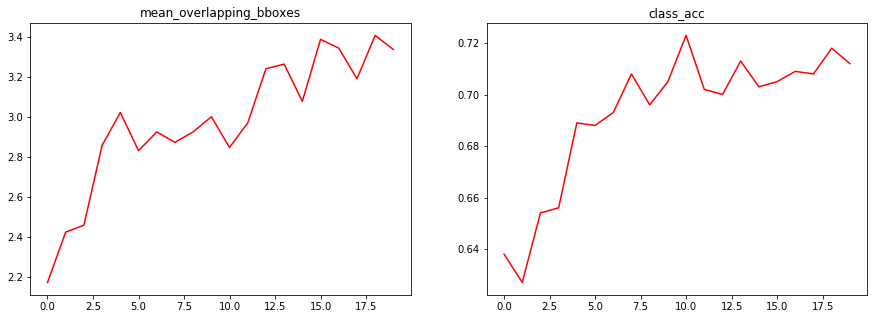

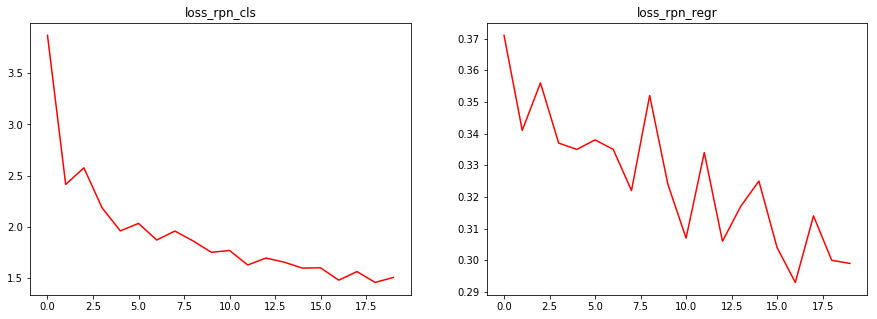

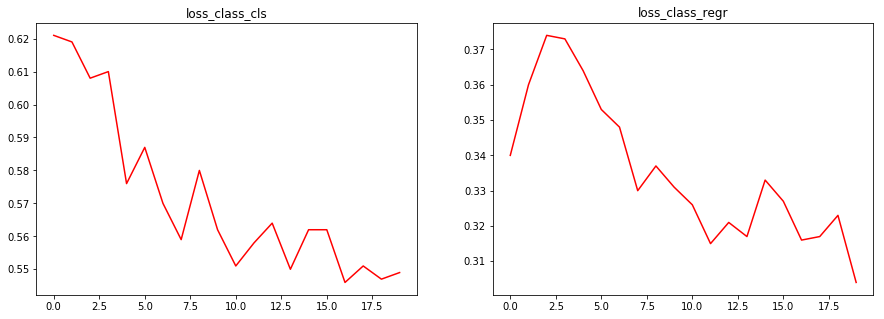

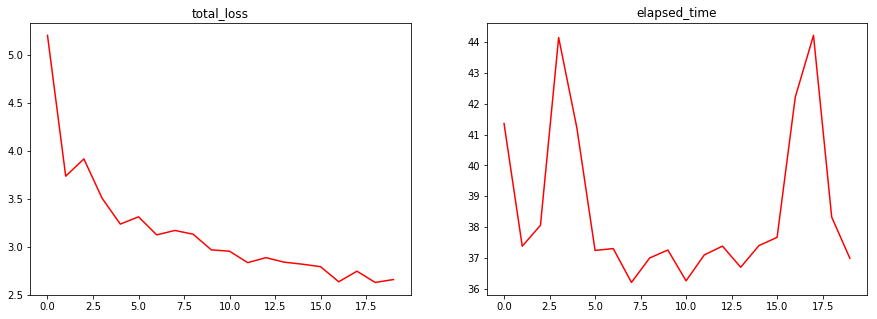

In [16]:
# Load the records
record_df = pd.read_csv(C.record_path)

r_epochs = len(record_df)

plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
plt.plot(np.arange(0, r_epochs), record_df['mean_overlapping_bboxes'], 'r')
plt.title('mean_overlapping_bboxes')

plt.subplot(1,2,2)
plt.plot(np.arange(0, r_epochs), record_df['class_acc'], 'r')
plt.title('class_acc')

plt.show()

plt.figure(figsize=(15,5))

plt.subplot(1,2,1)
plt.plot(np.arange(0, r_epochs), record_df['loss_rpn_cls'], 'r')
plt.title('loss_rpn_cls')

plt.subplot(1,2,2)
plt.plot(np.arange(0, r_epochs), record_df['loss_rpn_regr'], 'r')
plt.title('loss_rpn_regr')
plt.show()
plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
plt.plot(np.arange(0, r_epochs), record_df['loss_class_cls'], 'r')
plt.title('loss_class_cls')

plt.subplot(1,2,2)
plt.plot(np.arange(0, r_epochs), record_df['loss_class_regr'], 'r')
plt.title('loss_class_regr')
plt.show()
plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
plt.plot(np.arange(0, r_epochs), record_df['curr_loss'], 'r')
plt.title('total_loss')

plt.subplot(1,2,2)
plt.plot(np.arange(0, r_epochs), record_df['elapsed_time'], 'r')
plt.title('elapsed_time')

plt.show()

In [17]:
def format_img_size(img, C):
	#print(img)
	""" formats the image size based on config """
	img_min_side = float(C.im_size)
	(height,width,_) = img.shape
		
	if width <= height:
		ratio = img_min_side/width
		new_height = int(ratio * height)
		new_width = int(img_min_side)
	else:
		ratio = img_min_side/height
		new_width = int(ratio * width)
		new_height = int(img_min_side)
	img = cv2.resize(img, (new_width, new_height), interpolation=cv2.INTER_CUBIC)
	return img, ratio	

def format_img_channels(img, C):
	""" formats the image channels based on config """
	img = img[:, :, (2, 1, 0)]
	img = img.astype(np.float32)
	img[:, :, 0] -= C.img_channel_mean[0]
	img[:, :, 1] -= C.img_channel_mean[1]
	img[:, :, 2] -= C.img_channel_mean[2]
	img /= C.img_scaling_factor
	img = np.transpose(img, (2, 0, 1))
	img = np.expand_dims(img, axis=0)
	return img

def format_img(img, C):
	""" formats an image for model prediction based on config """
	img, ratio = format_img_size(img, C)
	img = format_img_channels(img, C)
	return img, ratio

# Method to transform the coordinates of the bounding box to its original size
def get_real_coordinates(ratio, x1, y1, x2, y2):

	real_x1 = int(round(x1 // ratio))
	real_y1 = int(round(y1 // ratio))
	real_x2 = int(round(x2 // ratio))
	real_y2 = int(round(y2 // ratio))

	return (real_x1, real_y1, real_x2 ,real_y2)

In [18]:
num_features = 512

input_shape_img = (None, None, 3)
input_shape_features = (None, None, num_features)

img_input = Input(shape=input_shape_img)
roi_input = Input(shape=(C.num_rois, 4))
feature_map_input = Input(shape=input_shape_features)

# define the base network (VGG here, can be Resnet50, Inception, etc)
shared_layers = nn_base(img_input, trainable=True)

# define the RPN, built on the base layers
num_anchors = len(C.anchor_box_scales) * len(C.anchor_box_ratios)
rpn_layers = rpn_layer(shared_layers, num_anchors)

classifier = classifier_layer(feature_map_input, roi_input, C.num_rois, nb_classes=len(C.class_mapping))

model_rpn = Model(img_input, rpn_layers)
model_classifier_only = Model([feature_map_input, roi_input], classifier)

model_classifier = Model([feature_map_input, roi_input], classifier)

print('Loading weights from {}'.format(C.model_path))
model_rpn.load_weights(C.model_path, by_name=True)
model_classifier.load_weights(C.model_path, by_name=True)

model_rpn.compile(optimizer='sgd', loss='mse')
model_classifier.compile(optimizer='sgd', loss='mse')

Loading weights from Dataset\model/model_frcnn_vgg.hdf5


In [19]:
# Switch key value for class mapping
class_mapping = C.class_mapping
class_mapping = {v: k for k, v in class_mapping.items()}
print(class_mapping)
class_to_color = {class_mapping[v]: np.random.randint(0, 255, 3) for v in class_mapping}

{0: 'Lung Opacity', 1: 'bg'}


In [20]:
test_imgs = os.listdir(test_base_path)

imgs_path = []
for i in range(50):
	idx = np.random.randint(len(test_imgs))
	imgs_path.append(test_imgs[idx])

all_imgs = []

classes = {}

e22136f5-4d6c-4d2d-aa6d-4585aad874f0.jpg
Elapsed time = 5.805207967758179
[('Lung Opacity', 92.4268901348114), ('Lung Opacity', 72.46153354644775)]


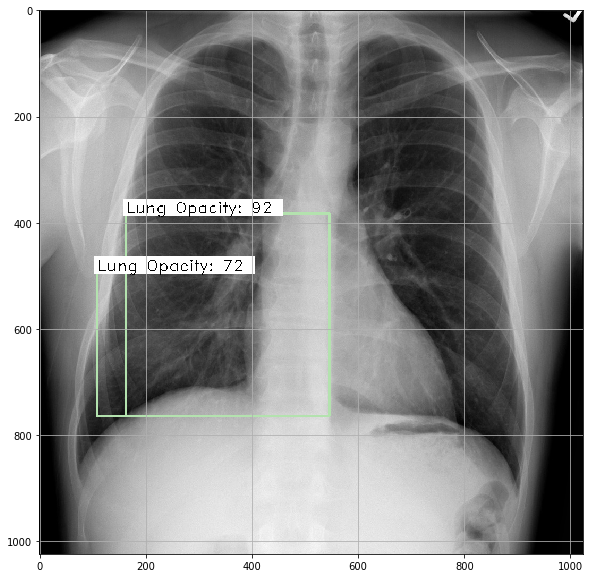

91469c45-c082-45c8-9cd1-946e6adeaac8.jpg
Elapsed time = 5.623670339584351
[('Lung Opacity', 81.20023012161255)]


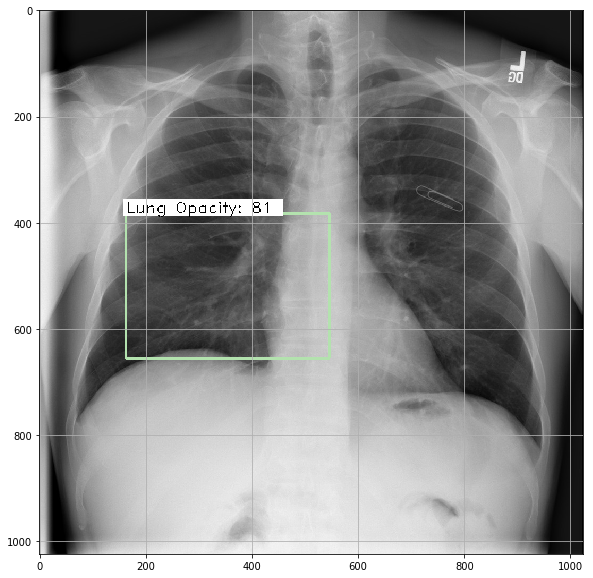

c26298ce-b514-490b-8502-a0952edf4409.jpg
Elapsed time = 5.473857402801514
[('Lung Opacity', 70.53492665290833)]


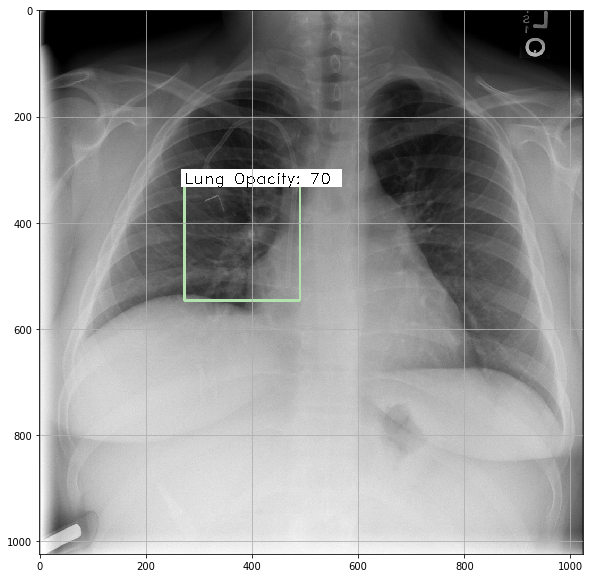

3f040848-3b3f-4cc9-b7e1-eb5bea7a3a7c.jpg
Elapsed time = 5.6103551387786865
[]


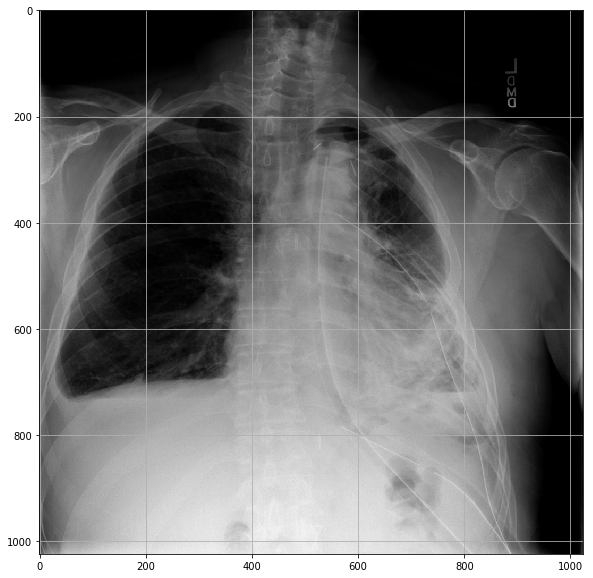

cb6fc930-b91d-4986-a959-a47aecaf957e.jpg
Elapsed time = 5.447075128555298
[('Lung Opacity', 76.44355893135071)]


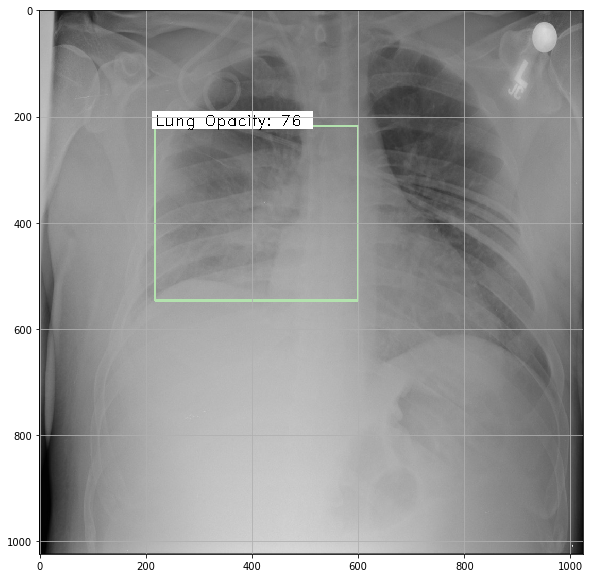

c6195ab0-2904-43a0-9f9f-c61ed6b0f9a3.jpg
Elapsed time = 5.660820245742798
[('Lung Opacity', 79.41111326217651)]


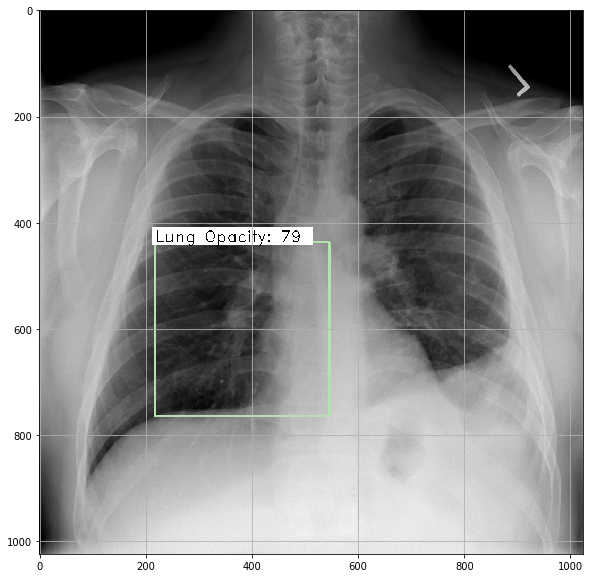

7d0e3887-2263-4c54-8833-cb9886a62152.jpg
Elapsed time = 5.406102418899536
[('Lung Opacity', 79.81007099151611)]


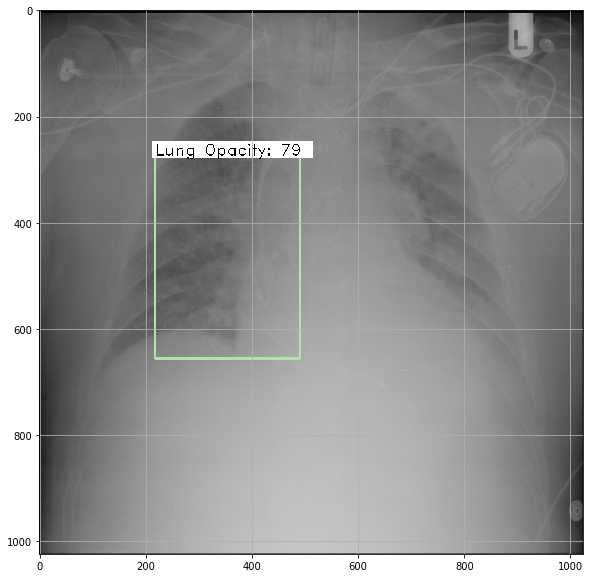

e971f635-8ac2-4ce8-9983-034b1188cfcc.jpg
Elapsed time = 5.570777416229248
[('Lung Opacity', 88.80768418312073)]


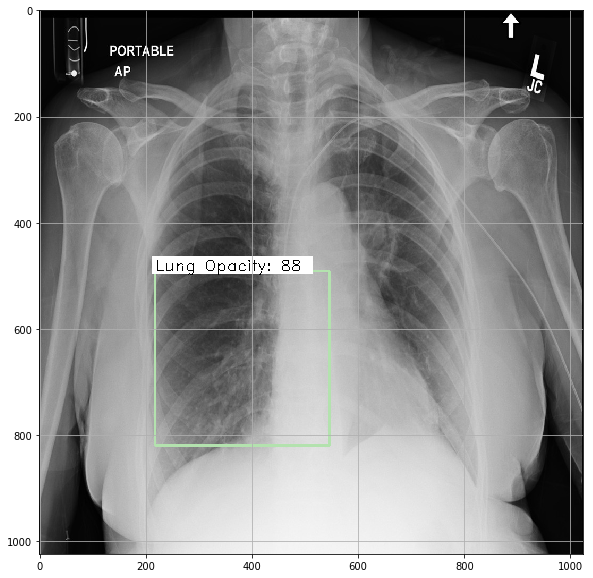

b41dfb17-3773-485b-8da6-c29a2bbfbe3a.jpg
Elapsed time = 5.527443885803223
[('Lung Opacity', 85.92525124549866)]


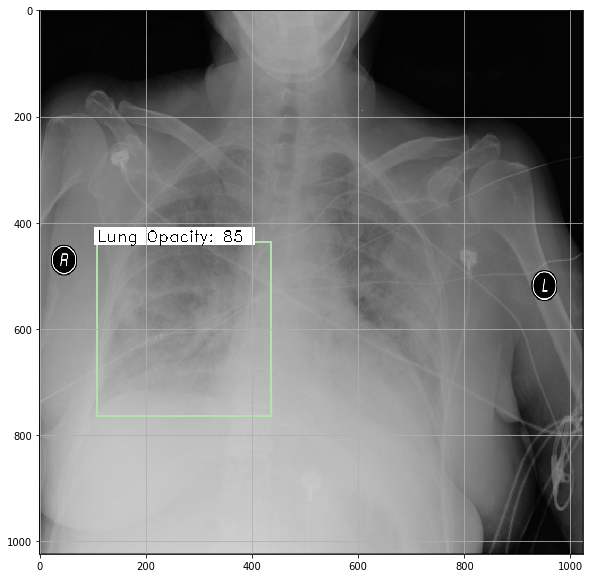

5fc4c038-98f2-485c-b86f-63508d589cab.jpg
Elapsed time = 5.32932448387146
[('Lung Opacity', 72.1722662448883)]


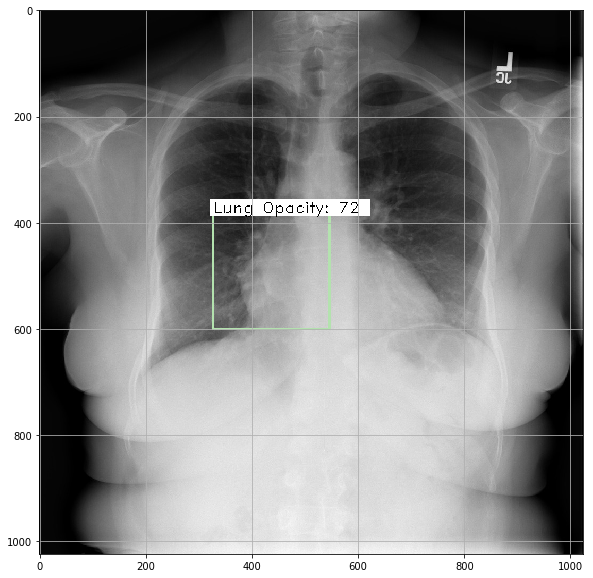

d39eae7d-6b1d-4481-a27d-978adedde95a.jpg
Elapsed time = 5.26839804649353
[('Lung Opacity', 72.4832534790039)]


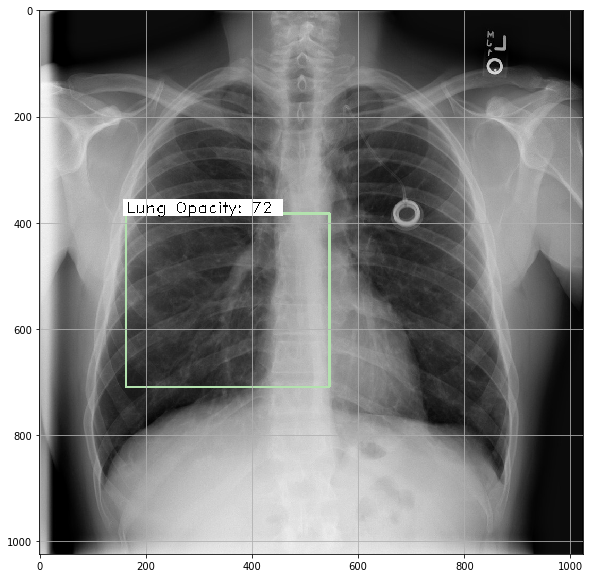

821692fd-9659-4179-b408-e4dda2e10dae.jpg
Elapsed time = 5.279550552368164
[('Lung Opacity', 78.90236377716064)]


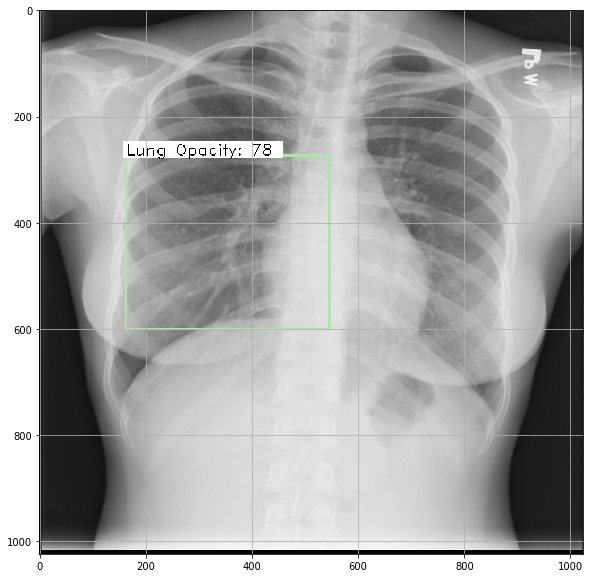

aaf2b2bf-1be7-4247-94d4-d899da6c263c.jpg
Elapsed time = 5.259221792221069
[('Lung Opacity', 89.18906450271606)]


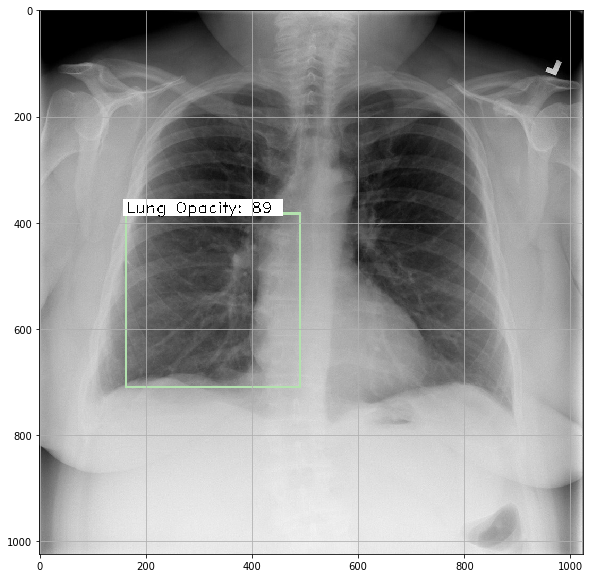

a0ca289b-6e0b-433d-a45b-8f86044e1ae1.jpg
Elapsed time = 5.292421102523804
[('Lung Opacity', 87.40845918655396), ('Lung Opacity', 77.6404619216919)]


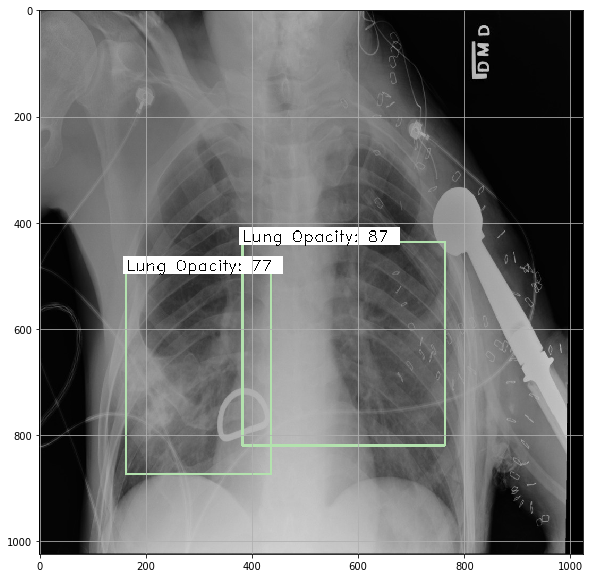

5964c088-a893-4ff0-bd02-e4e2b636b7ce.jpg
Elapsed time = 5.32106876373291
[('Lung Opacity', 72.56313562393188)]


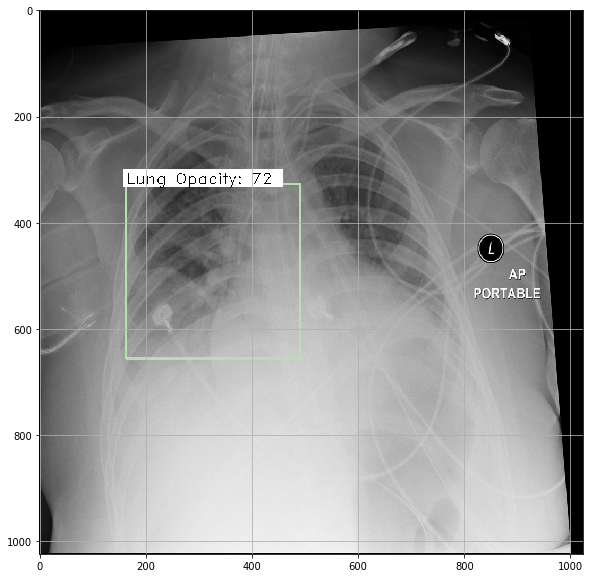

6b275c38-b928-4119-8bfc-cdf34e2f58c0.jpg
Elapsed time = 5.2829601764678955
[('Lung Opacity', 81.61739110946655)]


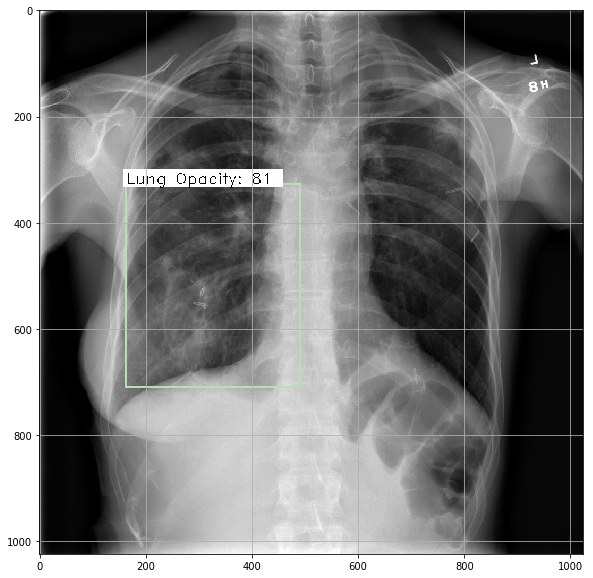

5848e2cd-4a74-400f-8fe8-f78c136a2ec3.jpg
Elapsed time = 5.270977973937988
[('Lung Opacity', 86.13763451576233), ('Lung Opacity', 78.67568731307983)]


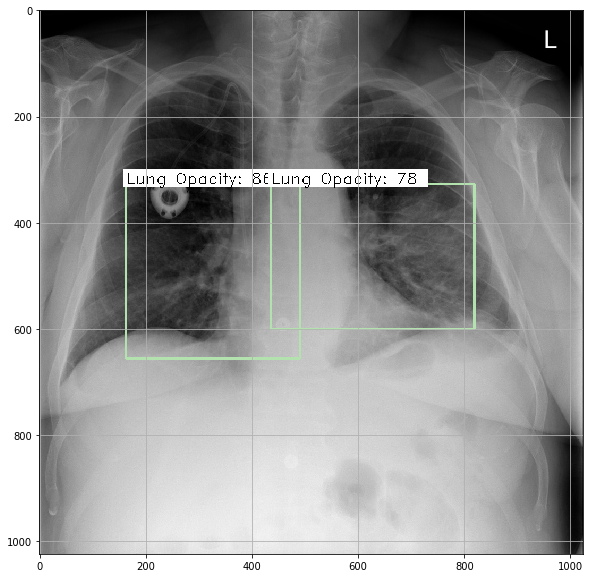

3c2270fa-2323-48c2-a341-1ea0d84d7cee.jpg
Elapsed time = 5.290488243103027
[('Lung Opacity', 76.5375018119812)]


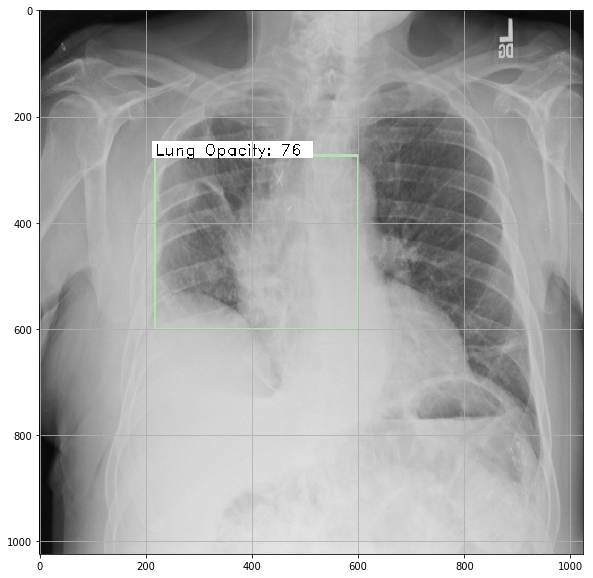

479c8352-38cc-4af7-87f0-125b8f1564bb.jpg
Elapsed time = 5.266258001327515
[('Lung Opacity', 73.8734781742096)]


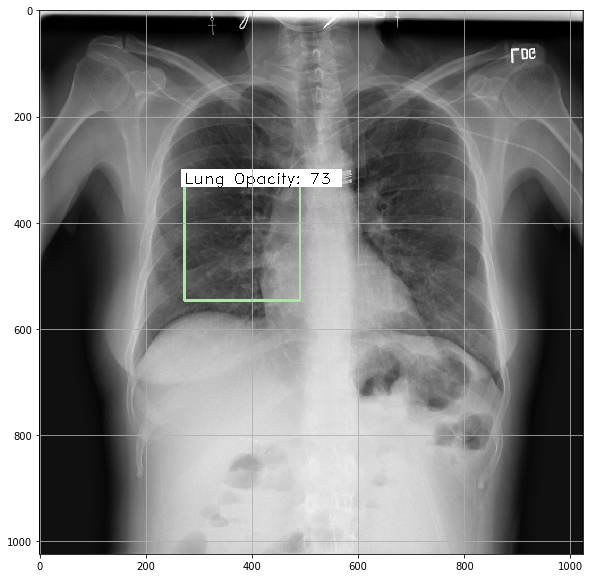

7aab12d5-960d-472b-a46e-d229f6ca70ee.jpg
Elapsed time = 5.29781699180603
[('Lung Opacity', 76.6746461391449), ('Lung Opacity', 73.55321049690247)]


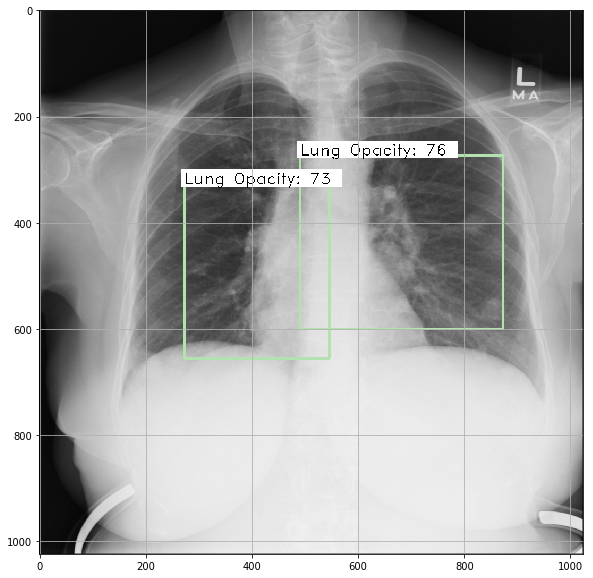

2c810189-ae70-403e-8846-3286925af6dd.jpg
Elapsed time = 5.325878620147705
[('Lung Opacity', 75.9647011756897)]


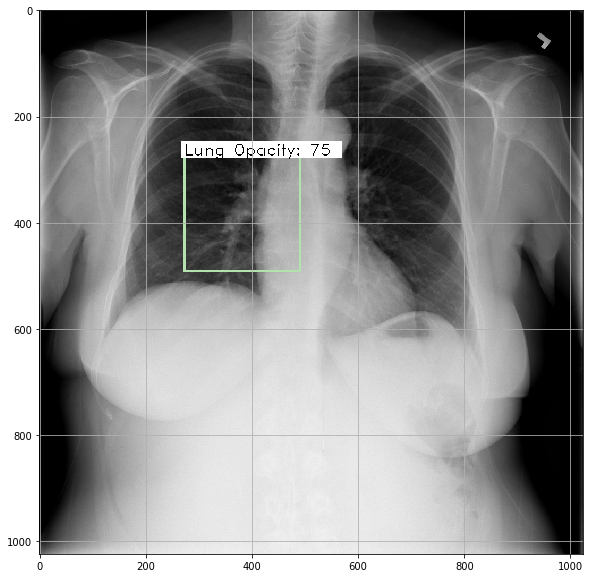

fe23b27d-db99-40f5-b2ab-d9a91cc361cc.jpg
Elapsed time = 5.273338317871094
[('Lung Opacity', 83.07037949562073)]


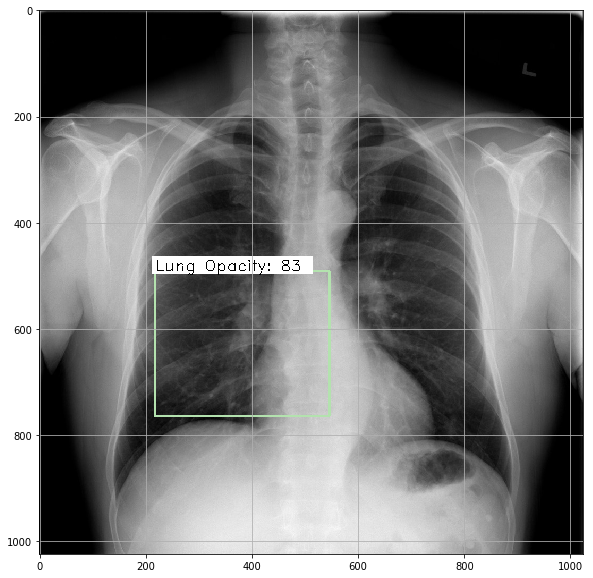

7245635f-de15-4117-9069-e39743d9da2f.jpg
Elapsed time = 5.279910087585449
[('Lung Opacity', 85.67038178443909)]


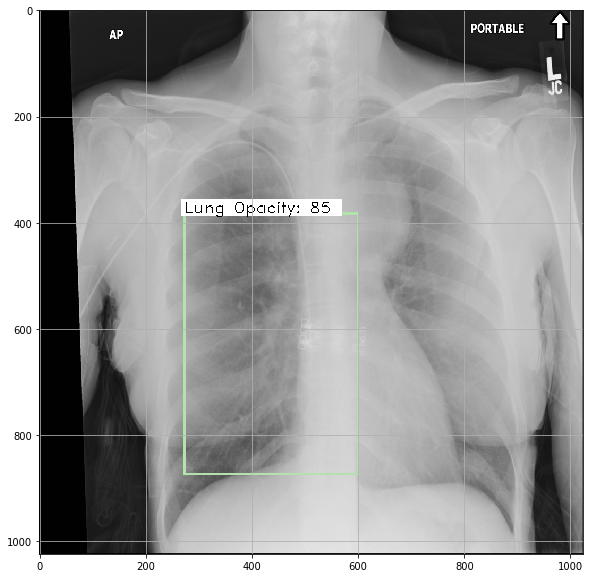

a4f59dc8-23f9-4738-9a5b-e72a28938115.jpg
Elapsed time = 5.276288032531738
[('Lung Opacity', 80.87868690490723)]


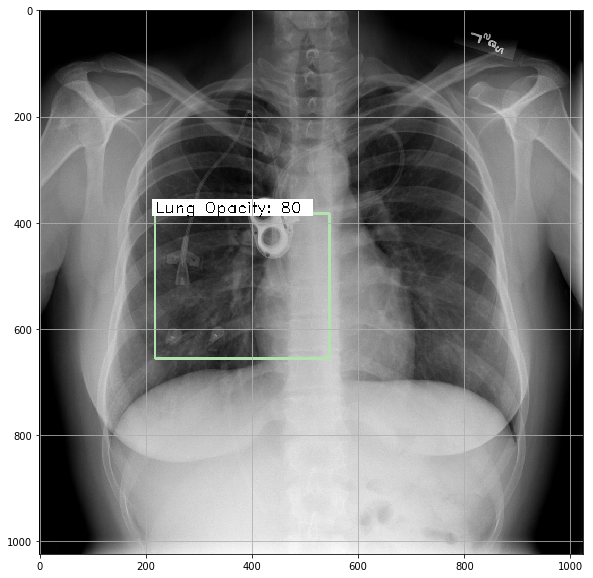

df5797ca-9b18-45c4-9dd6-301975a7903e.jpg
Elapsed time = 5.292523145675659
[]


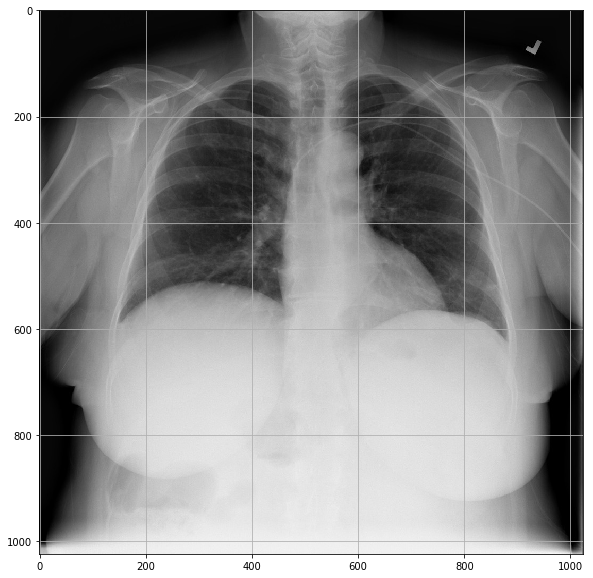

8ec24404-283d-4734-a620-8be3618ef4b0.jpg
Elapsed time = 5.29168963432312
[('Lung Opacity', 72.41976261138916)]


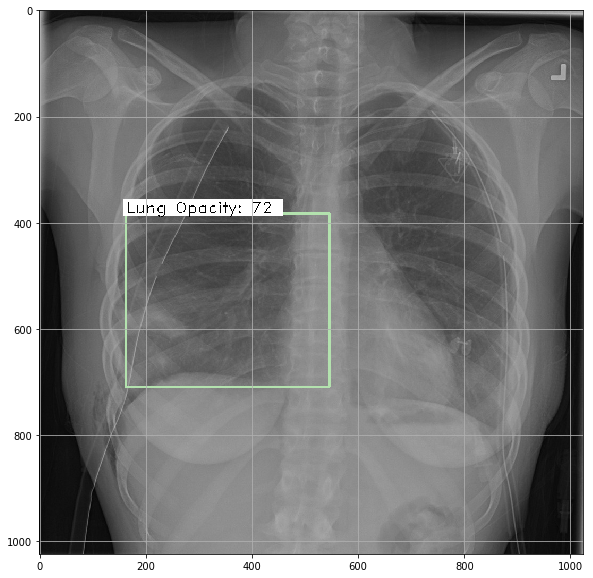

52d0a012-33da-4d4f-bad2-6373af5cf833.jpg
Elapsed time = 5.354085206985474
[('Lung Opacity', 81.7908763885498)]


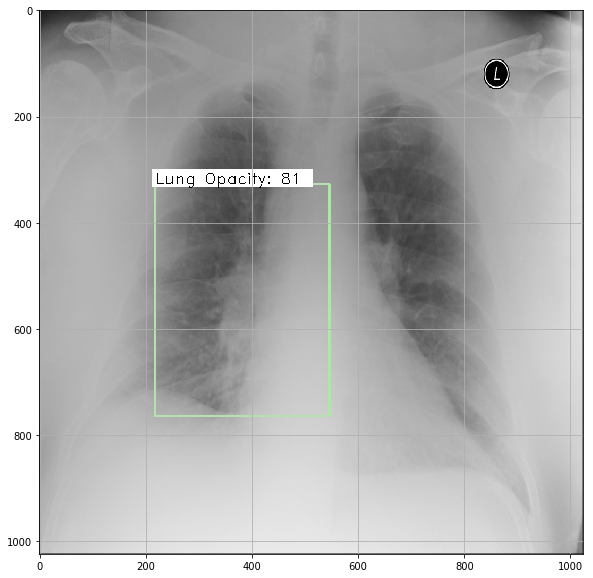

d4653287-cdac-4e8b-94db-b3c71147faf4.jpg
Elapsed time = 5.289795160293579
[]


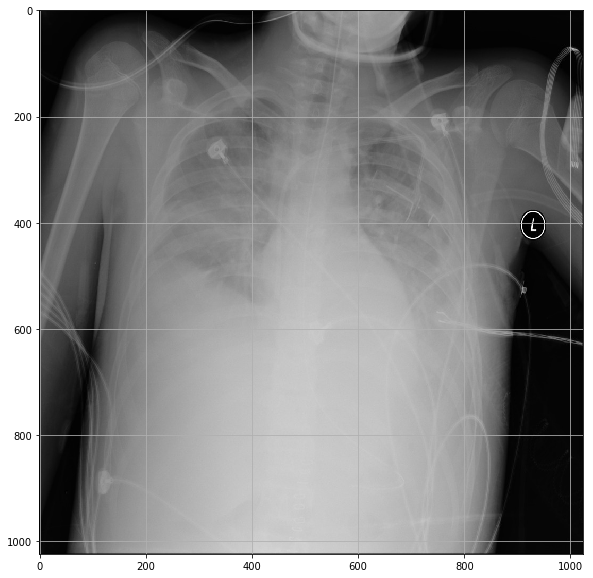

3703a60d-cd4c-4183-865d-82825a95af81.jpg
Elapsed time = 5.3275041580200195
[('Lung Opacity', 81.69411420822144)]


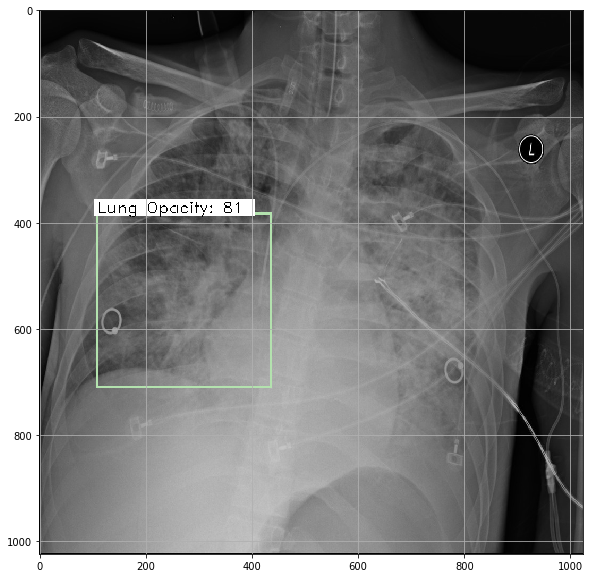

4e60231e-3d1b-40b5-bbeb-d8b136cbad6c.jpg
Elapsed time = 5.394717216491699
[('Lung Opacity', 77.91669368743896)]


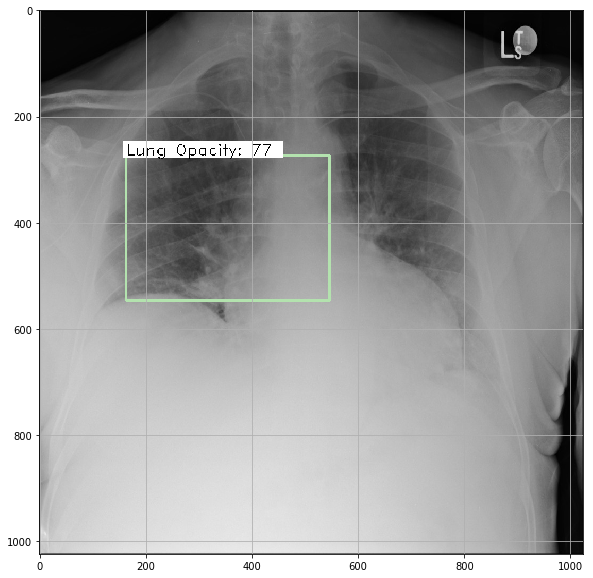

48f71d7f-72ea-4993-a9df-11e808508db4.jpg
Elapsed time = 5.2830212116241455
[('Lung Opacity', 83.5405170917511)]


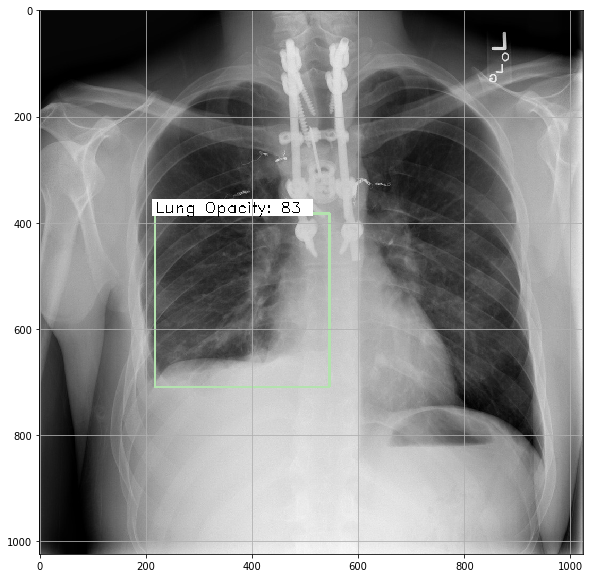

e7b35203-8f37-4838-81ac-e569bdb1dfa4.jpg
Elapsed time = 5.321906566619873
[]


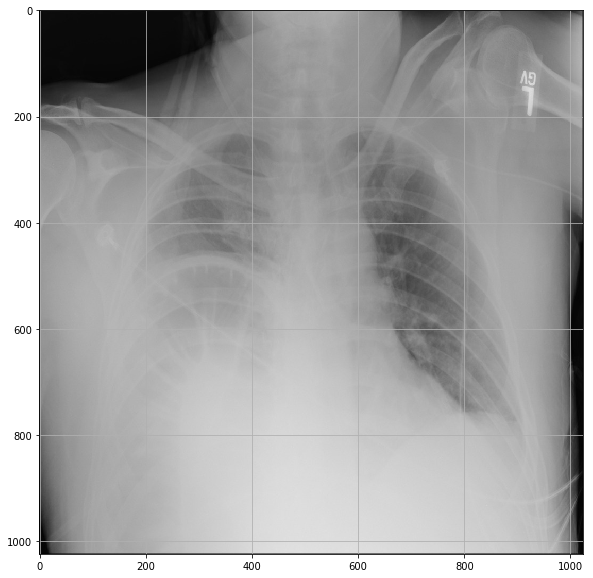

ab11cf1c-5b23-49b4-a6c8-460f69ba2ffe.jpg
Elapsed time = 5.29744815826416
[('Lung Opacity', 91.26016497612), ('Lung Opacity', 84.20276045799255), ('Lung Opacity', 70.19947171211243)]


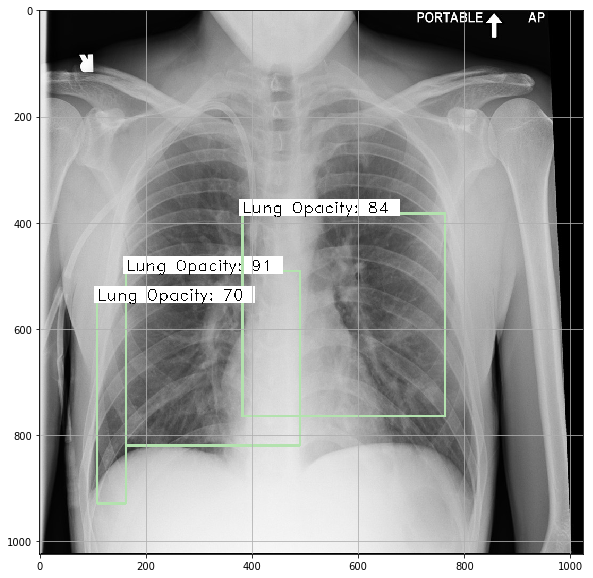

bd04fa63-5ecd-42da-bf2f-6214896bfc3e.jpg
Elapsed time = 5.280799150466919
[('Lung Opacity', 70.65149545669556)]


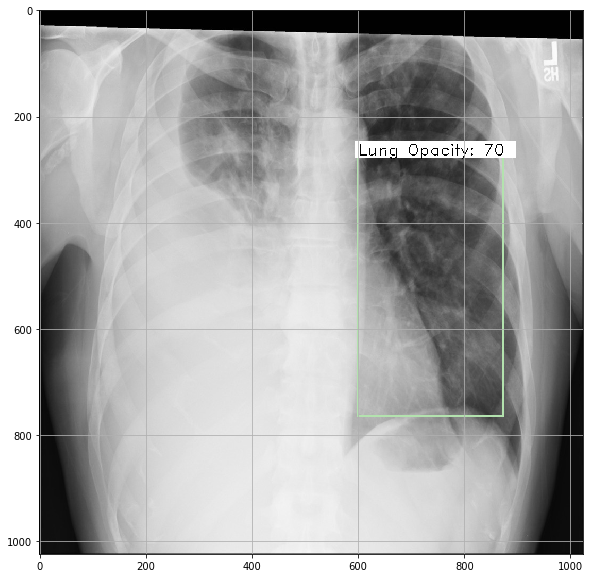

a681b516-2502-4518-830c-67db38985979.jpg
Elapsed time = 5.297002077102661
[('Lung Opacity', 81.32038712501526)]


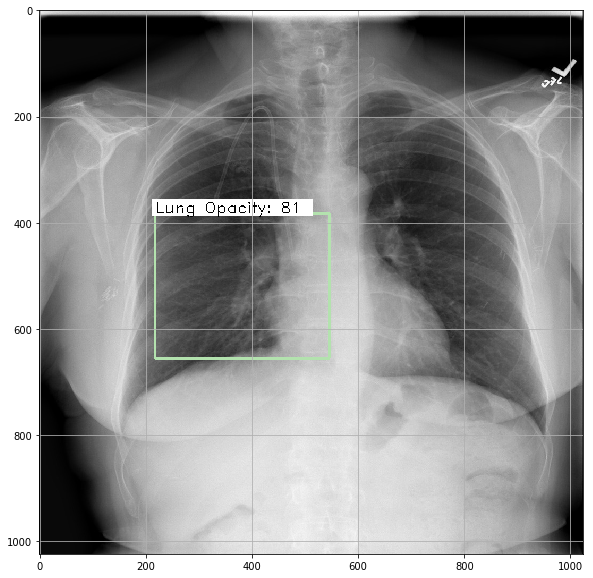

a6dfffb9-e267-4535-bb87-62ca8098dbf4.jpg
Elapsed time = 5.337048768997192
[('Lung Opacity', 77.14378237724304)]


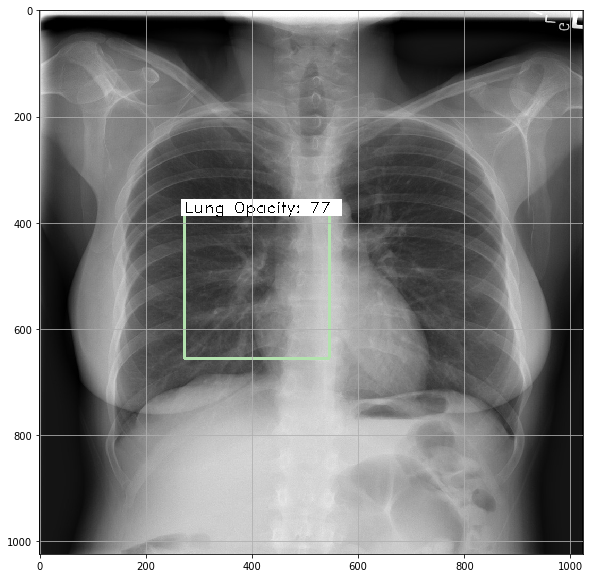

0425c2d3-5491-42af-8284-a3ee2f3819dc.jpg
Elapsed time = 5.29423189163208
[]


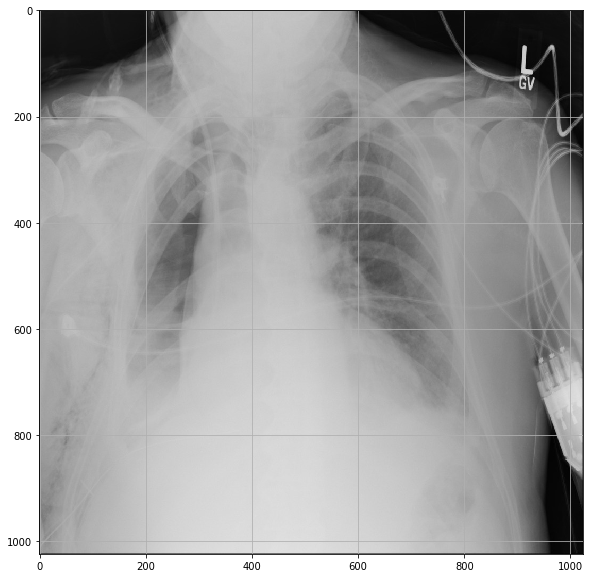

79d2cd00-12c6-4710-ab46-673794f3e130.jpg
Elapsed time = 5.3426079750061035
[('Lung Opacity', 77.82882452011108)]


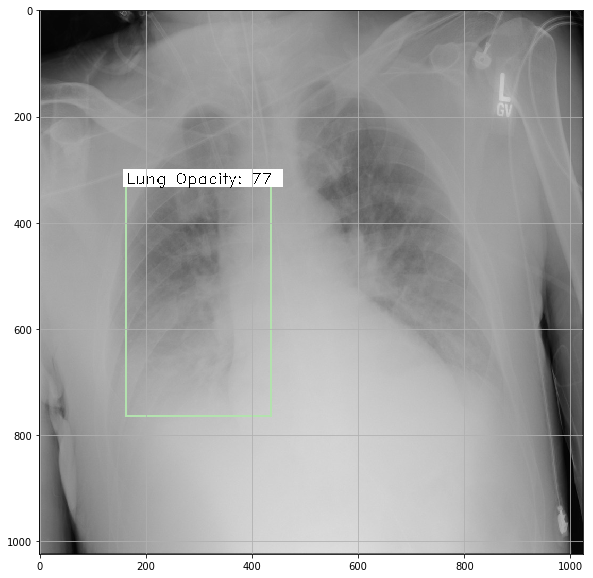

7918b5a8-0e82-43e9-ac13-70472f297d88.jpg
Elapsed time = 5.345133066177368
[('Lung Opacity', 88.77493143081665)]


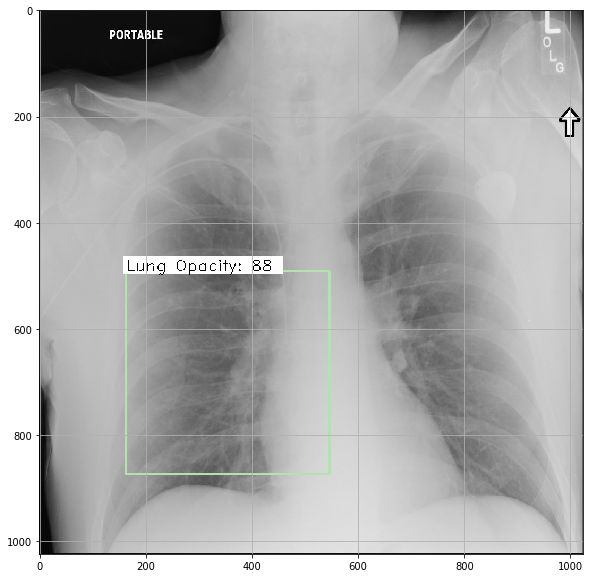

6eb6709e-9031-41a1-a033-fdecda741b96.jpg
Elapsed time = 5.762861967086792
[('Lung Opacity', 88.17985653877258)]


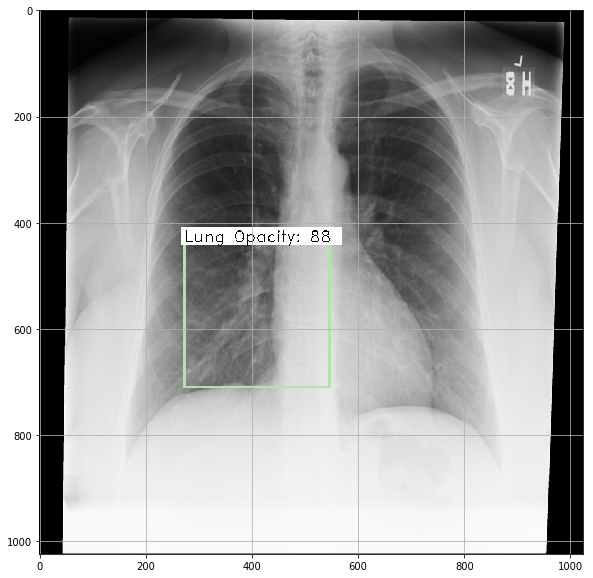

cd84b533-e235-4458-a278-69b67d743b83.jpg
Elapsed time = 5.658534049987793
[('Lung Opacity', 75.63774585723877)]


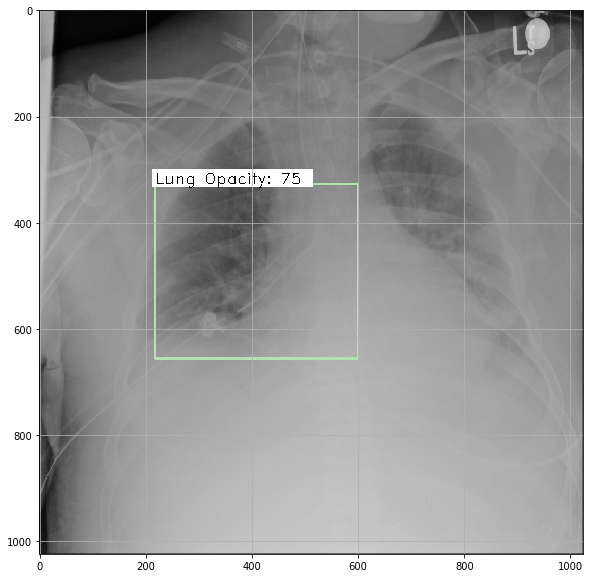

3859c702-3847-4208-996b-583666a4799f.jpg
Elapsed time = 5.696008682250977
[('Lung Opacity', 73.13798666000366)]


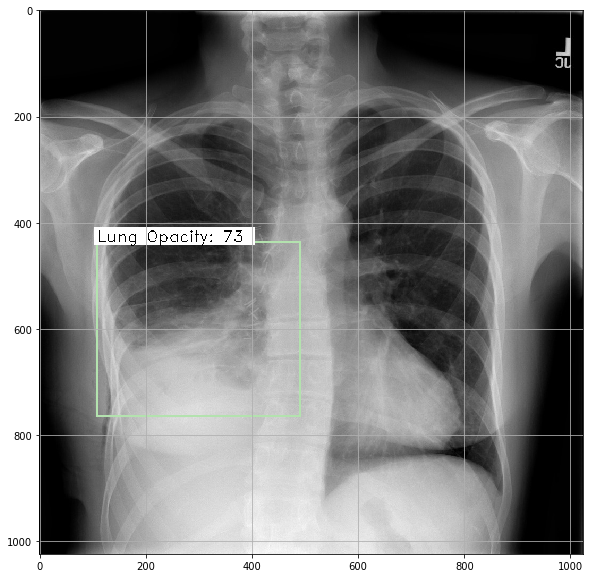

5191c1d7-b90e-46a1-b5e6-3459f03ece80.jpg
Elapsed time = 5.768638372421265
[('Lung Opacity', 74.89398717880249)]


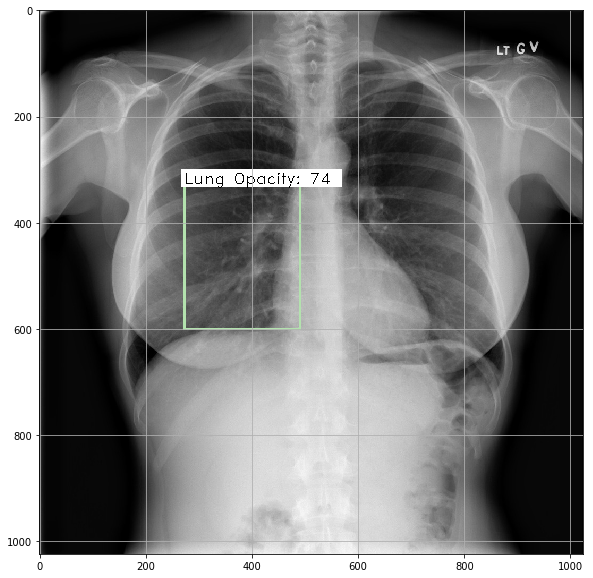

aa819afb-106c-4d2a-a32e-e9ca8f5d63a6.jpg
Elapsed time = 5.870737791061401
[('Lung Opacity', 78.31960916519165)]


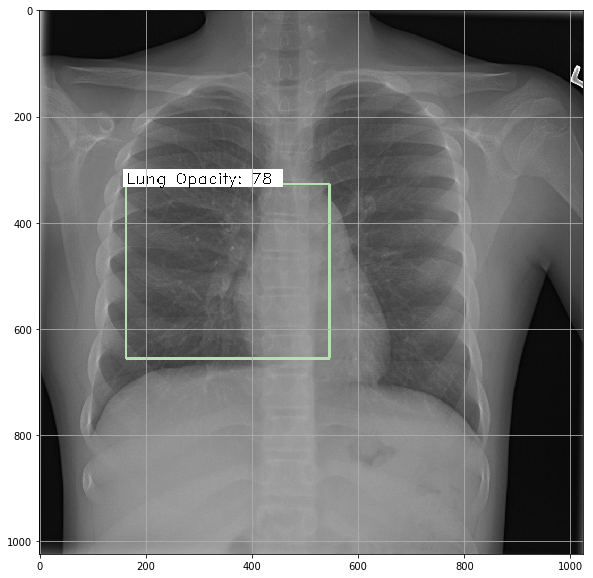

b1d17d4b-d189-411f-8099-e3949633a32f.jpg
Elapsed time = 5.371180057525635
[('Lung Opacity', 82.62346982955933)]


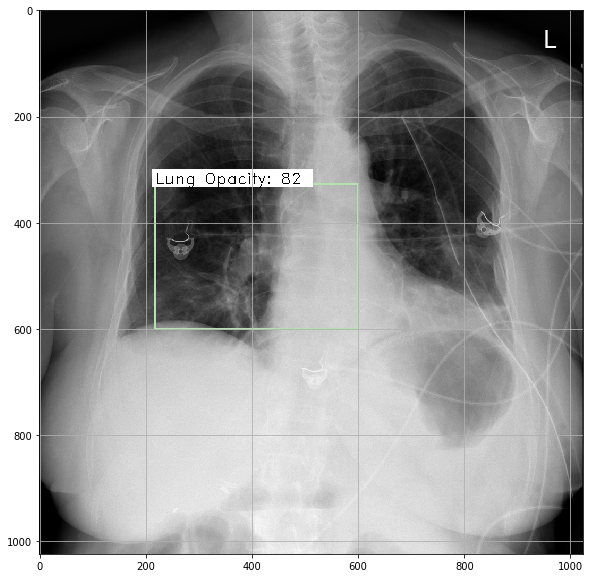

7d042363-6a99-4925-a9ae-886d298fcdbf.jpg
Elapsed time = 5.284264087677002
[]


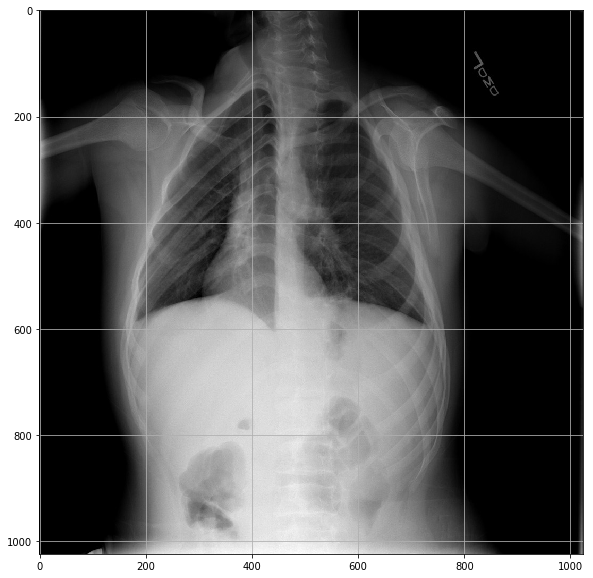

7b8e6b7c-06c0-4006-8cbe-f1d92edeed07.jpg
Elapsed time = 5.3169310092926025
[('Lung Opacity', 74.99985098838806), ('Lung Opacity', 74.04770255088806)]


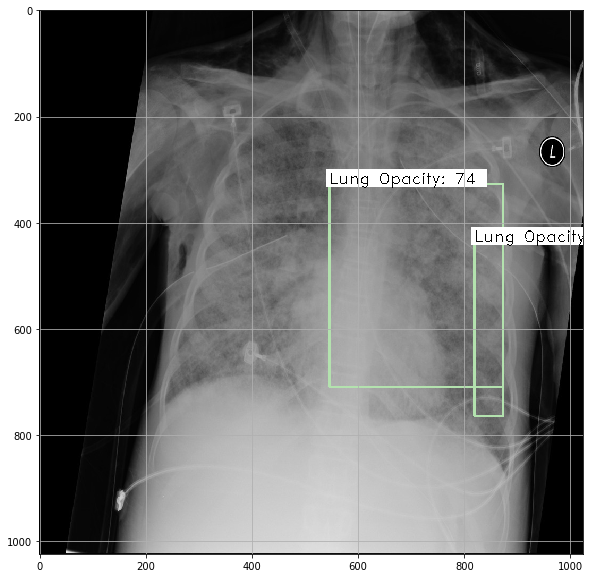

f5dd9e14-95a4-4d0b-8589-4a0001486e94.jpg
Elapsed time = 5.31723952293396
[('Lung Opacity', 87.50026226043701), ('Lung Opacity', 86.5554690361023), ('Lung Opacity', 72.84806370735168)]


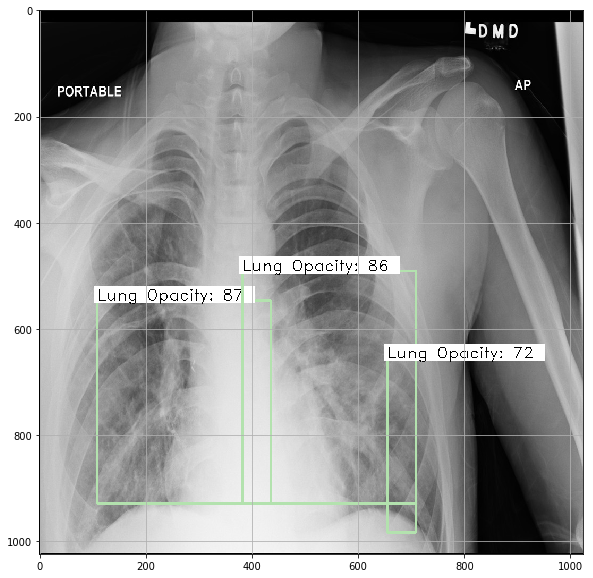

650cebf5-615e-48fc-afb5-4e5b355ade92.jpg
Elapsed time = 5.306692600250244
[]


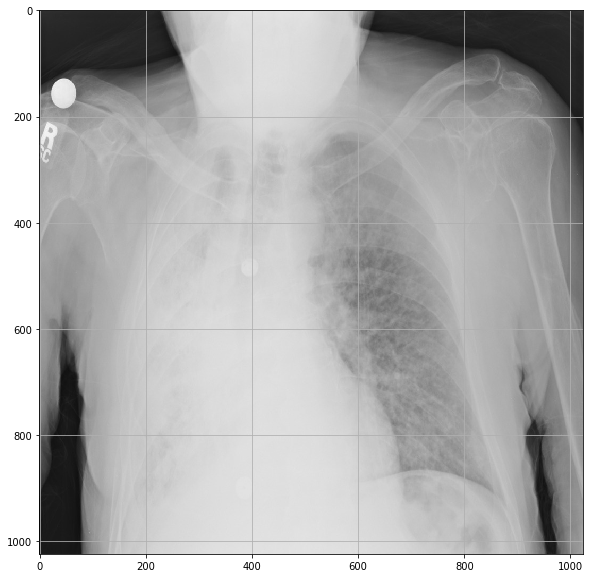

113850e1-6d28-4d63-bc5e-807ab3213995.jpg
Elapsed time = 5.303669214248657
[]


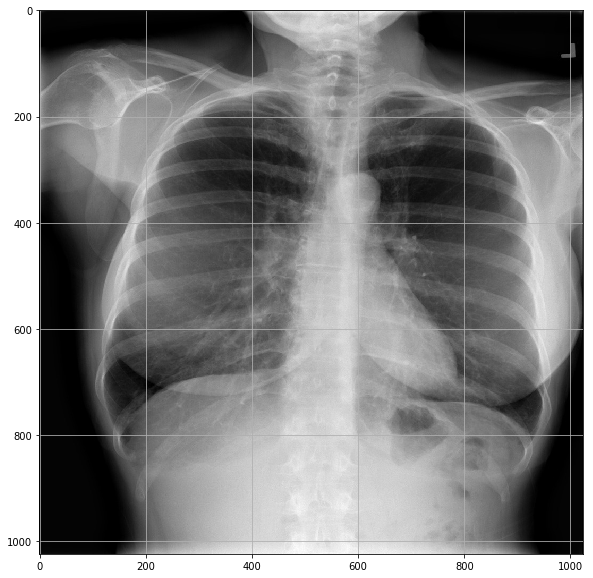

In [21]:
# If the box classification value is less than this, we ignore this box
bbox_threshold = 0.7

for idx, img_name in enumerate(imgs_path):
    if not img_name.lower().endswith(('.bmp', '.jpeg', '.jpg', '.png', '.tif', '.tiff')):
        continue
    print(img_name)
    st = time.time()
    filepath = os.path.join(test_base_path, img_name)

    img = cv2.imread(filepath)

    X, ratio = format_img(img, C)
    
    X = np.transpose(X, (0, 2, 3, 1))

    # get output layer Y1, Y2 from the RPN and the feature maps F
    # Y1: y_rpn_cls
    # Y2: y_rpn_regr
    [Y1, Y2, F] = model_rpn.predict(X)

    # Get bboxes by applying NMS 
    # R.shape = (300, 4)
    R = rpn_to_roi(Y1, Y2, C, K.common.image_dim_ordering(), overlap_thresh=0.7)

    # convert from (x1,y1,x2,y2) to (x,y,w,h)
    R[:, 2] -= R[:, 0]
    R[:, 3] -= R[:, 1]

    # apply the spatial pyramid pooling to the proposed regions
    bboxes = {}
    probs = {}

    for jk in range(R.shape[0]//C.num_rois + 1):
        ROIs = np.expand_dims(R[C.num_rois*jk:C.num_rois*(jk+1), :], axis=0)
        if ROIs.shape[1] == 0:
            break

        if jk == R.shape[0]//C.num_rois:
            #pad R
            curr_shape = ROIs.shape
            target_shape = (curr_shape[0],C.num_rois,curr_shape[2])
            ROIs_padded = np.zeros(target_shape).astype(ROIs.dtype)
            ROIs_padded[:, :curr_shape[1], :] = ROIs
            ROIs_padded[0, curr_shape[1]:, :] = ROIs[0, 0, :]
            ROIs = ROIs_padded

        [P_cls, P_regr] = model_classifier_only.predict([F, ROIs])

        # Calculate bboxes coordinates on resized image
        for ii in range(P_cls.shape[1]):
            # Ignore 'bg' class
            if np.max(P_cls[0, ii, :]) < bbox_threshold or np.argmax(P_cls[0, ii, :]) == (P_cls.shape[2] - 1):
                continue

            cls_name = class_mapping[np.argmax(P_cls[0, ii, :])]

            if cls_name not in bboxes:
                bboxes[cls_name] = []
                probs[cls_name] = []

            (x, y, w, h) = ROIs[0, ii, :]

            cls_num = np.argmax(P_cls[0, ii, :])
            try:
                (tx, ty, tw, th) = P_regr[0, ii, 4*cls_num:4*(cls_num+1)]
                tx /= C.classifier_regr_std[0]
                ty /= C.classifier_regr_std[1]
                tw /= C.classifier_regr_std[2]
                th /= C.classifier_regr_std[3]
                x, y, w, h = apply_regr(x, y, w, h, tx, ty, tw, th)
            except:
                pass
            bboxes[cls_name].append([C.rpn_stride*x, C.rpn_stride*y, C.rpn_stride*(x+w), C.rpn_stride*(y+h)])
            probs[cls_name].append(np.max(P_cls[0, ii, :]))

    all_dets = []

    for key in bboxes:
        bbox = np.array(bboxes[key])

        new_boxes, new_probs = non_max_suppression_fast(bbox, np.array(probs[key]), overlap_thresh=0.2)
        for jk in range(new_boxes.shape[0]):
            (x1, y1, x2, y2) = new_boxes[jk,:]

            # Calculate real coordinates on original image
            (real_x1, real_y1, real_x2, real_y2) = get_real_coordinates(ratio, x1, y1, x2, y2)

            cv2.rectangle(img,(real_x1, real_y1), (real_x2, real_y2), (int(class_to_color[key][0]), int(class_to_color[key][1]), int(class_to_color[key][2])),4)

            textLabel = '{}: {}'.format(key,int(100*new_probs[jk]))
            all_dets.append((key,100*new_probs[jk]))

            (retval,baseLine) = cv2.getTextSize(textLabel,cv2.FONT_HERSHEY_COMPLEX,1,1)
            textOrg = (real_x1, real_y1-0)

            cv2.rectangle(img, (textOrg[0] - 5, textOrg[1]+baseLine - 5), (textOrg[0]+retval[0] + 5, textOrg[1]-retval[1] - 5), (0, 0, 0), 1)
            cv2.rectangle(img, (textOrg[0] - 5,textOrg[1]+baseLine - 5), (textOrg[0]+retval[0] + 5, textOrg[1]-retval[1] - 5), (255, 255, 255), -1)
            cv2.putText(img, textLabel, textOrg, cv2.FONT_HERSHEY_DUPLEX, 1, (0, 0, 0), 1)

    print('Elapsed time = {}'.format(time.time() - st))
    print(all_dets)
    plt.figure(figsize=(10,10))
    plt.grid()
    plt.imshow(cv2.cvtColor(img,cv2.COLOR_BGR2RGB))
    plt.show()

In [22]:
def get_map(pred, gt, f):
	T = {}
	P = {}
	fx, fy = f

	for bbox in gt:
		bbox['bbox_matched'] = False

	pred_probs = np.array([s['prob'] for s in pred])
	box_idx_sorted_by_prob = np.argsort(pred_probs)[::-1]

	for box_idx in box_idx_sorted_by_prob:
		pred_box = pred[box_idx]
		pred_class = pred_box['class']
		pred_x1 = pred_box['x1']
		pred_x2 = pred_box['x2']
		pred_y1 = pred_box['y1']
		pred_y2 = pred_box['y2']
		pred_prob = pred_box['prob']
		if pred_class not in P:
			P[pred_class] = []
			T[pred_class] = []
		P[pred_class].append(pred_prob)
		found_match = False

		for gt_box in gt:
			gt_class = gt_box['class']
			gt_x1 = gt_box['x1']/fx
			gt_x2 = gt_box['x2']/fx
			gt_y1 = gt_box['y1']/fy
			gt_y2 = gt_box['y2']/fy
			gt_seen = gt_box['bbox_matched']
			if gt_class != pred_class:
				continue
			if gt_seen:
				continue
			iou_map = iou((pred_x1, pred_y1, pred_x2, pred_y2), (gt_x1, gt_y1, gt_x2, gt_y2))
			if iou_map >= 0.5:
				found_match = True
				gt_box['bbox_matched'] = True
				break
			else:
				continue

		T[pred_class].append(int(found_match))

	for gt_box in gt:
		if not gt_box['bbox_matched']:# and not gt_box['difficult']:
			if gt_box['class'] not in P:
				P[gt_box['class']] = []
				T[gt_box['class']] = []

			T[gt_box['class']].append(1)
			P[gt_box['class']].append(0)

	#import pdb
	#pdb.set_trace()
	return T, P

In [23]:
def format_img_map(img, C):
	"""Format image for mAP. Resize original image to C.im_size (300 in here)

	Args:
		img: cv2 image
		C: config

	Returns:
		img: Scaled and normalized image with expanding dimension
		fx: ratio for width scaling
		fy: ratio for height scaling
	"""

	img_min_side = float(C.im_size)
	(height,width,_) = img.shape
	
	if width <= height:
		f = img_min_side/width
		new_height = int(f * height)
		new_width = int(img_min_side)
	else:
		f = img_min_side/height
		new_width = int(f * width)
		new_height = int(img_min_side)
	fx = width/float(new_width)
	fy = height/float(new_height)
	img = cv2.resize(img, (new_width, new_height), interpolation=cv2.INTER_CUBIC)
	# Change image channel from BGR to RGB
	img = img[:, :, (2, 1, 0)]
	img = img.astype(np.float32)
	img[:, :, 0] -= C.img_channel_mean[0]
	img[:, :, 1] -= C.img_channel_mean[1]
	img[:, :, 2] -= C.img_channel_mean[2]
	img /= C.img_scaling_factor
	# Change img shape from (height, width, channel) to (channel, height, width)
	img = np.transpose(img, (2, 0, 1))
	# Expand one dimension at axis 0
	# img shape becames (1, channel, height, width)
	img = np.expand_dims(img, axis=0)
	return img, fx, fy

In [24]:
print(class_mapping)

{0: 'Lung Opacity', 1: 'bg'}


In [25]:
# This might takes a while to parser the data
test_imgs, _, _ = get_data(test_path)

Parsing annotation files
idx=1909

In [26]:
T = {}
P = {}
mAPs = []
for idx, img_data in enumerate(test_imgs):
    print('{}/{}'.format(idx,len(test_imgs)))
    st = time.time()
    filepath = img_data['filepath']

    img = cv2.imread(filepath)

    X, fx, fy = format_img_map(img, C)

    # Change X (img) shape from (1, channel, height, width) to (1, height, width, channel)
    X = np.transpose(X, (0, 2, 3, 1))

    # get the feature maps and output from the RPN
    [Y1, Y2, F] = model_rpn.predict(X)


    R = rpn_to_roi(Y1, Y2, C,  K.common.image_dim_ordering(), overlap_thresh=0.7)

    # convert from (x1,y1,x2,y2) to (x,y,w,h)
    R[:, 2] -= R[:, 0]
    R[:, 3] -= R[:, 1]

    # apply the spatial pyramid pooling to the proposed regions
    bboxes = {}
    probs = {}

    for jk in range(R.shape[0] // C.num_rois + 1):
        ROIs = np.expand_dims(R[C.num_rois * jk:C.num_rois * (jk + 1), :], axis=0)
        if ROIs.shape[1] == 0:
            break

        if jk == R.shape[0] // C.num_rois:
            # pad R
            curr_shape = ROIs.shape
            target_shape = (curr_shape[0], C.num_rois, curr_shape[2])
            ROIs_padded = np.zeros(target_shape).astype(ROIs.dtype)
            ROIs_padded[:, :curr_shape[1], :] = ROIs
            ROIs_padded[0, curr_shape[1]:, :] = ROIs[0, 0, :]
            ROIs = ROIs_padded

        [P_cls, P_regr] = model_classifier_only.predict([F, ROIs])

        # Calculate all classes' bboxes coordinates on resized image (300, 400)
        # Drop 'bg' classes bboxes
        for ii in range(P_cls.shape[1]):

            # If class name is 'bg', continue
            if np.argmax(P_cls[0, ii, :]) == (P_cls.shape[2] - 1):
                continue

            # Get class name
            cls_name = class_mapping[np.argmax(P_cls[0, ii, :])]

            if cls_name not in bboxes:
                bboxes[cls_name] = []
                probs[cls_name] = []

            (x, y, w, h) = ROIs[0, ii, :]

            cls_num = np.argmax(P_cls[0, ii, :])
            try:
                (tx, ty, tw, th) = P_regr[0, ii, 4 * cls_num:4 * (cls_num + 1)]
                tx /= C.classifier_regr_std[0]
                ty /= C.classifier_regr_std[1]
                tw /= C.classifier_regr_std[2]
                th /= C.classifier_regr_std[3]
                x, y, w, h = roi_helpers.apply_regr(x, y, w, h, tx, ty, tw, th)
            except:
                pass
            bboxes[cls_name].append([16 * x, 16 * y, 16 * (x + w), 16 * (y + h)])
            probs[cls_name].append(np.max(P_cls[0, ii, :]))

    all_dets = []

    for key in bboxes:
        bbox = np.array(bboxes[key])

        # Apply non-max-suppression on final bboxes to get the output bounding boxe
        new_boxes, new_probs = non_max_suppression_fast(bbox, np.array(probs[key]), overlap_thresh=0.5)
        for jk in range(new_boxes.shape[0]):
            (x1, y1, x2, y2) = new_boxes[jk, :]
            det = {'x1': x1, 'x2': x2, 'y1': y1, 'y2': y2, 'class': key, 'prob': new_probs[jk]}
            all_dets.append(det)


    print('Elapsed time = {}'.format(time.time() - st))
    t, p = get_map(all_dets, img_data['bboxes'], (fx, fy))
    for key in t.keys():
        if key not in T:
            T[key] = []
            P[key] = []
        T[key].extend(t[key])
        P[key].extend(p[key])
    all_aps = []
    for key in T.keys():
        ap = average_precision_score(T[key], P[key])
        print('{} AP: {}'.format(key, ap))
        all_aps.append(ap)
    print('mAP = {}'.format(np.mean(np.array(all_aps))))
    mAPs.append(np.mean(np.array(all_aps)))
    #print(T)
    #print(P)
    
print()
print('mean average precision:', np.mean(np.array(mAPs)))

0/1253
Elapsed time = 5.3549652099609375
Lung Opacity AP: 0.05
mAP = 0.05
1/1253
Elapsed time = 5.343159198760986
Lung Opacity AP: 0.08514492753623187
mAP = 0.08514492753623187
2/1253
Elapsed time = 5.321401357650757
Lung Opacity AP: 0.08943452380952381
mAP = 0.08943452380952381
3/1253
Elapsed time = 5.3108811378479
Lung Opacity AP: 0.0878846153846154
mAP = 0.0878846153846154
4/1253
Elapsed time = 5.342235326766968
Lung Opacity AP: 0.09348272642390289
mAP = 0.09348272642390289
5/1253
Elapsed time = 5.322864055633545
Lung Opacity AP: 0.0957280847245636
mAP = 0.0957280847245636
6/1253
Elapsed time = 5.307961463928223
Lung Opacity AP: 0.0996244775339603
mAP = 0.0996244775339603
7/1253
Elapsed time = 5.315443992614746
Lung Opacity AP: 0.087534435261708
mAP = 0.087534435261708
8/1253
Elapsed time = 5.349826335906982
Lung Opacity AP: 0.08742789662202477
mAP = 0.08742789662202477
9/1253
Elapsed time = 5.401438236236572
Lung Opacity AP: 0.09220347940106004
mAP = 0.09220347940106004
10/1253
Ela

Elapsed time = 5.30137825012207
Lung Opacity AP: 0.11574204095625348
mAP = 0.11574204095625348
81/1253
Elapsed time = 5.252087116241455
Lung Opacity AP: 0.11408230326659158
mAP = 0.11408230326659158
82/1253
Elapsed time = 5.257487773895264
Lung Opacity AP: 0.11357151369685585
mAP = 0.11357151369685585
83/1253
Elapsed time = 5.271358251571655
Lung Opacity AP: 0.11189873110422108
mAP = 0.11189873110422108
84/1253
Elapsed time = 5.256195068359375
Lung Opacity AP: 0.11151674714043217
mAP = 0.11151674714043217
85/1253
Elapsed time = 5.269676923751831
Lung Opacity AP: 0.11122656904099607
mAP = 0.11122656904099607
86/1253
Elapsed time = 5.245934963226318
Lung Opacity AP: 0.11244676126542705
mAP = 0.11244676126542705
87/1253
Elapsed time = 5.384145498275757
Lung Opacity AP: 0.11241880813372186
mAP = 0.11241880813372186
88/1253
Elapsed time = 5.274313449859619
Lung Opacity AP: 0.11262240484553676
mAP = 0.11262240484553676
89/1253
Elapsed time = 5.280619144439697
Lung Opacity AP: 0.1126206552779

Elapsed time = 5.233029842376709
Lung Opacity AP: 0.11469344283821714
mAP = 0.11469344283821714
160/1253
Elapsed time = 5.231292486190796
Lung Opacity AP: 0.11484885613626812
mAP = 0.11484885613626812
161/1253
Elapsed time = 5.224468231201172
Lung Opacity AP: 0.11462197209453025
mAP = 0.11462197209453025
162/1253
Elapsed time = 5.20857834815979
Lung Opacity AP: 0.11467441385252175
mAP = 0.11467441385252175
163/1253
Elapsed time = 5.2271952629089355
Lung Opacity AP: 0.11507066122091626
mAP = 0.11507066122091626
164/1253
Elapsed time = 5.216022968292236
Lung Opacity AP: 0.11958288221621613
mAP = 0.11958288221621613
165/1253
Elapsed time = 5.21666693687439
Lung Opacity AP: 0.120016511714759
mAP = 0.120016511714759
166/1253
Elapsed time = 5.216974973678589
Lung Opacity AP: 0.11971149642357073
mAP = 0.11971149642357073
167/1253
Elapsed time = 5.2400007247924805
Lung Opacity AP: 0.11953146829985067
mAP = 0.11953146829985067
168/1253
Elapsed time = 5.225258111953735
Lung Opacity AP: 0.1194450

Elapsed time = 5.2149436473846436
Lung Opacity AP: 0.12157911042554878
mAP = 0.12157911042554878
239/1253
Elapsed time = 5.224661350250244
Lung Opacity AP: 0.12133757776744865
mAP = 0.12133757776744865
240/1253
Elapsed time = 5.232631206512451
Lung Opacity AP: 0.12129252380729494
mAP = 0.12129252380729494
241/1253
Elapsed time = 5.213954925537109
Lung Opacity AP: 0.12092142123271779
mAP = 0.12092142123271779
242/1253
Elapsed time = 5.210203409194946
Lung Opacity AP: 0.12154243055940656
mAP = 0.12154243055940656
243/1253
Elapsed time = 5.218085289001465
Lung Opacity AP: 0.12318613731108499
mAP = 0.12318613731108499
244/1253
Elapsed time = 5.232114791870117
Lung Opacity AP: 0.12368539161102379
mAP = 0.12368539161102379
245/1253
Elapsed time = 5.203854560852051
Lung Opacity AP: 0.12370182411218089
mAP = 0.12370182411218089
246/1253
Elapsed time = 5.223289728164673
Lung Opacity AP: 0.12378167517735317
mAP = 0.12378167517735317
247/1253
Elapsed time = 5.349053621292114
Lung Opacity AP: 0.12

Elapsed time = 5.231890916824341
Lung Opacity AP: 0.131375380415289
mAP = 0.131375380415289
318/1253
Elapsed time = 5.219096660614014
Lung Opacity AP: 0.13138890850267515
mAP = 0.13138890850267515
319/1253
Elapsed time = 5.215070724487305
Lung Opacity AP: 0.132261731456283
mAP = 0.132261731456283
320/1253
Elapsed time = 5.204494476318359
Lung Opacity AP: 0.13212982329183576
mAP = 0.13212982329183576
321/1253
Elapsed time = 5.226437568664551
Lung Opacity AP: 0.13219457787699138
mAP = 0.13219457787699138
322/1253
Elapsed time = 5.223906517028809
Lung Opacity AP: 0.13202107780089278
mAP = 0.13202107780089278
323/1253
Elapsed time = 5.20989990234375
Lung Opacity AP: 0.13195476625628877
mAP = 0.13195476625628877
324/1253
Elapsed time = 5.240452289581299
Lung Opacity AP: 0.13244002882464673
mAP = 0.13244002882464673
325/1253
Elapsed time = 5.230530738830566
Lung Opacity AP: 0.1323700865885944
mAP = 0.1323700865885944
326/1253
Elapsed time = 5.2138612270355225
Lung Opacity AP: 0.1324664867079

Elapsed time = 5.228628873825073
Lung Opacity AP: 0.1409900451993947
mAP = 0.1409900451993947
397/1253
Elapsed time = 5.210458755493164
Lung Opacity AP: 0.14058026406942328
mAP = 0.14058026406942328
398/1253
Elapsed time = 5.208659410476685
Lung Opacity AP: 0.14057002701882548
mAP = 0.14057002701882548
399/1253
Elapsed time = 5.220890522003174
Lung Opacity AP: 0.1414664463253797
mAP = 0.1414664463253797
400/1253
Elapsed time = 5.231505632400513
Lung Opacity AP: 0.14098863216015606
mAP = 0.14098863216015606
401/1253
Elapsed time = 5.209700584411621
Lung Opacity AP: 0.14140639175831723
mAP = 0.14140639175831723
402/1253
Elapsed time = 5.226065397262573
Lung Opacity AP: 0.1414960883436121
mAP = 0.1414960883436121
403/1253
Elapsed time = 5.221640586853027
Lung Opacity AP: 0.14111147949993974
mAP = 0.14111147949993974
404/1253
Elapsed time = 5.297449111938477
Lung Opacity AP: 0.1409390758946218
mAP = 0.1409390758946218
405/1253
Elapsed time = 5.235119581222534
Lung Opacity AP: 0.14068297471

Elapsed time = 5.2285988330841064
Lung Opacity AP: 0.14745736784688226
mAP = 0.14745736784688226
476/1253
Elapsed time = 5.356382608413696
Lung Opacity AP: 0.14843825009361342
mAP = 0.14843825009361342
477/1253
Elapsed time = 5.2327330112457275
Lung Opacity AP: 0.14840872919819373
mAP = 0.14840872919819373
478/1253
Elapsed time = 5.228978395462036
Lung Opacity AP: 0.14825647997989388
mAP = 0.14825647997989388
479/1253
Elapsed time = 5.249680280685425
Lung Opacity AP: 0.14912199237663032
mAP = 0.14912199237663032
480/1253
Elapsed time = 5.231419086456299
Lung Opacity AP: 0.14956522601148364
mAP = 0.14956522601148364
481/1253
Elapsed time = 5.221942663192749
Lung Opacity AP: 0.1492796771841159
mAP = 0.1492796771841159
482/1253
Elapsed time = 5.237274646759033
Lung Opacity AP: 0.14928416689267798
mAP = 0.14928416689267798
483/1253
Elapsed time = 5.220990896224976
Lung Opacity AP: 0.14920724875303212
mAP = 0.14920724875303212
484/1253
Elapsed time = 5.22178840637207
Lung Opacity AP: 0.1490

Elapsed time = 5.278449058532715
Lung Opacity AP: 0.15199791531369194
mAP = 0.15199791531369194
555/1253
Elapsed time = 5.272464990615845
Lung Opacity AP: 0.15218367358910073
mAP = 0.15218367358910073
556/1253
Elapsed time = 5.2604289054870605
Lung Opacity AP: 0.15265340804599548
mAP = 0.15265340804599548
557/1253
Elapsed time = 5.248939037322998
Lung Opacity AP: 0.15249790860781534
mAP = 0.15249790860781534
558/1253
Elapsed time = 5.2177653312683105
Lung Opacity AP: 0.15211762276365492
mAP = 0.15211762276365492
559/1253
Elapsed time = 5.245380878448486
Lung Opacity AP: 0.15254400592347264
mAP = 0.15254400592347264
560/1253
Elapsed time = 5.2531983852386475
Lung Opacity AP: 0.15332079893053735
mAP = 0.15332079893053735
561/1253
Elapsed time = 5.227316617965698
Lung Opacity AP: 0.15320446147062056
mAP = 0.15320446147062056
562/1253
Elapsed time = 5.388944149017334
Lung Opacity AP: 0.1533031860925851
mAP = 0.1533031860925851
563/1253
Elapsed time = 5.266666889190674
Lung Opacity AP: 0.15

Elapsed time = 5.213766574859619
Lung Opacity AP: 0.15685174688584796
mAP = 0.15685174688584796
634/1253
Elapsed time = 5.332842111587524
Lung Opacity AP: 0.15745108144261527
mAP = 0.15745108144261527
635/1253
Elapsed time = 5.263314247131348
Lung Opacity AP: 0.1573533587167641
mAP = 0.1573533587167641
636/1253
Elapsed time = 5.20862889289856
Lung Opacity AP: 0.15727126373396394
mAP = 0.15727126373396394
637/1253
Elapsed time = 5.253944158554077
Lung Opacity AP: 0.15720230749204617
mAP = 0.15720230749204617
638/1253
Elapsed time = 5.226298093795776
Lung Opacity AP: 0.15703806029338524
mAP = 0.15703806029338524
639/1253
Elapsed time = 5.239302396774292
Lung Opacity AP: 0.15690271169038716
mAP = 0.15690271169038716
640/1253
Elapsed time = 5.227808475494385
Lung Opacity AP: 0.15710418899230547
mAP = 0.15710418899230547
641/1253
Elapsed time = 5.22854471206665
Lung Opacity AP: 0.157002826736873
mAP = 0.157002826736873
642/1253
Elapsed time = 5.233726263046265
Lung Opacity AP: 0.15697305279

Elapsed time = 5.236142158508301
Lung Opacity AP: 0.15252875222613088
mAP = 0.15252875222613088
713/1253
Elapsed time = 5.2280333042144775
Lung Opacity AP: 0.15243532999734238
mAP = 0.15243532999734238
714/1253
Elapsed time = 5.228574514389038
Lung Opacity AP: 0.15235032029988055
mAP = 0.15235032029988055
715/1253
Elapsed time = 5.288618564605713
Lung Opacity AP: 0.15221088727628912
mAP = 0.15221088727628912
716/1253
Elapsed time = 5.240878343582153
Lung Opacity AP: 0.1515590541996542
mAP = 0.1515590541996542
717/1253
Elapsed time = 5.449876308441162
Lung Opacity AP: 0.1520326355374841
mAP = 0.1520326355374841
718/1253
Elapsed time = 5.286499977111816
Lung Opacity AP: 0.1518595556292989
mAP = 0.1518595556292989
719/1253
Elapsed time = 5.264279127120972
Lung Opacity AP: 0.15229778538507774
mAP = 0.15229778538507774
720/1253
Elapsed time = 5.310606241226196
Lung Opacity AP: 0.15219568428540522
mAP = 0.15219568428540522
721/1253
Elapsed time = 5.315650939941406
Lung Opacity AP: 0.15215387

Elapsed time = 5.12589955329895
Lung Opacity AP: 0.1521050464764856
mAP = 0.1521050464764856
792/1253
Elapsed time = 5.159973382949829
Lung Opacity AP: 0.15197699771310758
mAP = 0.15197699771310758
793/1253
Elapsed time = 5.226419925689697
Lung Opacity AP: 0.15189295114446483
mAP = 0.15189295114446483
794/1253
Elapsed time = 5.210795640945435
Lung Opacity AP: 0.151777758579711
mAP = 0.151777758579711
795/1253
Elapsed time = 5.189857482910156
Lung Opacity AP: 0.15168706079500513
mAP = 0.15168706079500513
796/1253
Elapsed time = 5.115440607070923
Lung Opacity AP: 0.15161761176544175
mAP = 0.15161761176544175
797/1253
Elapsed time = 5.1111249923706055
Lung Opacity AP: 0.1515912478945472
mAP = 0.1515912478945472
798/1253
Elapsed time = 5.121868133544922
Lung Opacity AP: 0.15156887773432368
mAP = 0.15156887773432368
799/1253
Elapsed time = 5.138336181640625
Lung Opacity AP: 0.15146991565938034
mAP = 0.15146991565938034
800/1253
Elapsed time = 5.13045072555542
Lung Opacity AP: 0.151875774661

Elapsed time = 5.120021343231201
Lung Opacity AP: 0.15198128004420633
mAP = 0.15198128004420633
871/1253
Elapsed time = 5.306377649307251
Lung Opacity AP: 0.15172751750715244
mAP = 0.15172751750715244
872/1253
Elapsed time = 5.4309608936309814
Lung Opacity AP: 0.1515241378328078
mAP = 0.1515241378328078
873/1253
Elapsed time = 5.17088770866394
Lung Opacity AP: 0.151535587711919
mAP = 0.151535587711919
874/1253
Elapsed time = 5.168454885482788
Lung Opacity AP: 0.15149451913130196
mAP = 0.15149451913130196
875/1253
Elapsed time = 5.267287492752075
Lung Opacity AP: 0.1513182185098495
mAP = 0.1513182185098495
876/1253
Elapsed time = 5.403571128845215
Lung Opacity AP: 0.15158172943040651
mAP = 0.15158172943040651
877/1253
Elapsed time = 5.745970249176025
Lung Opacity AP: 0.15144893197393436
mAP = 0.15144893197393436
878/1253
Elapsed time = 5.63107442855835
Lung Opacity AP: 0.1515423449770979
mAP = 0.1515423449770979
879/1253
Elapsed time = 6.0847179889678955
Lung Opacity AP: 0.1514294522447

Elapsed time = 5.144749402999878
Lung Opacity AP: 0.15190042149056113
mAP = 0.15190042149056113
950/1253
Elapsed time = 5.153070688247681
Lung Opacity AP: 0.15217339414125847
mAP = 0.15217339414125847
951/1253
Elapsed time = 5.145908832550049
Lung Opacity AP: 0.1520697158058684
mAP = 0.1520697158058684
952/1253
Elapsed time = 5.151318073272705
Lung Opacity AP: 0.15194586511707603
mAP = 0.15194586511707603
953/1253
Elapsed time = 5.16774582862854
Lung Opacity AP: 0.1520876970311194
mAP = 0.1520876970311194
954/1253
Elapsed time = 5.109691381454468
Lung Opacity AP: 0.15204148817650023
mAP = 0.15204148817650023
955/1253
Elapsed time = 5.198322296142578
Lung Opacity AP: 0.15210349214314056
mAP = 0.15210349214314056
956/1253
Elapsed time = 5.161598205566406
Lung Opacity AP: 0.15208576803331642
mAP = 0.15208576803331642
957/1253
Elapsed time = 5.125718832015991
Lung Opacity AP: 0.15196612938815013
mAP = 0.15196612938815013
958/1253
Elapsed time = 5.168524742126465
Lung Opacity AP: 0.15204024

Elapsed time = 5.1366941928863525
Lung Opacity AP: 0.15113885783791509
mAP = 0.15113885783791509
1029/1253
Elapsed time = 5.135288715362549
Lung Opacity AP: 0.15105259013178707
mAP = 0.15105259013178707
1030/1253
Elapsed time = 5.090594530105591
Lung Opacity AP: 0.15122327806957792
mAP = 0.15122327806957792
1031/1253
Elapsed time = 5.0944154262542725
Lung Opacity AP: 0.15104140316841033
mAP = 0.15104140316841033
1032/1253
Elapsed time = 5.058954238891602
Lung Opacity AP: 0.15088883771480388
mAP = 0.15088883771480388
1033/1253
Elapsed time = 5.094884634017944
Lung Opacity AP: 0.15079494087187278
mAP = 0.15079494087187278
1034/1253
Elapsed time = 5.075443506240845
Lung Opacity AP: 0.15075620603259993
mAP = 0.15075620603259993
1035/1253
Elapsed time = 5.083272457122803
Lung Opacity AP: 0.15076700243973024
mAP = 0.15076700243973024
1036/1253
Elapsed time = 5.082488059997559
Lung Opacity AP: 0.15067117303079486
mAP = 0.15067117303079486
1037/1253
Elapsed time = 5.065037727355957
Lung Opacit

Elapsed time = 5.09005331993103
Lung Opacity AP: 0.15035630125958477
mAP = 0.15035630125958477
1107/1253
Elapsed time = 5.0732104778289795
Lung Opacity AP: 0.1501732351977353
mAP = 0.1501732351977353
1108/1253
Elapsed time = 5.093622922897339
Lung Opacity AP: 0.15038341954144263
mAP = 0.15038341954144263
1109/1253
Elapsed time = 5.084343194961548
Lung Opacity AP: 0.15093712069996001
mAP = 0.15093712069996001
1110/1253
Elapsed time = 5.08815860748291
Lung Opacity AP: 0.1507218230539775
mAP = 0.1507218230539775
1111/1253
Elapsed time = 5.06817889213562
Lung Opacity AP: 0.15073309822813907
mAP = 0.15073309822813907
1112/1253
Elapsed time = 5.084179401397705
Lung Opacity AP: 0.15146212493091013
mAP = 0.15146212493091013
1113/1253
Elapsed time = 5.081206560134888
Lung Opacity AP: 0.15139937489809313
mAP = 0.15139937489809313
1114/1253
Elapsed time = 5.100933313369751
Lung Opacity AP: 0.15197562407041137
mAP = 0.15197562407041137
1115/1253
Elapsed time = 5.081995964050293
Lung Opacity AP: 0.

Elapsed time = 5.078328371047974
Lung Opacity AP: 0.15118989672079836
mAP = 0.15118989672079836
1185/1253
Elapsed time = 5.089174747467041
Lung Opacity AP: 0.15116619386326166
mAP = 0.15116619386326166
1186/1253
Elapsed time = 5.182708740234375
Lung Opacity AP: 0.15118639190714306
mAP = 0.15118639190714306
1187/1253
Elapsed time = 5.071671724319458
Lung Opacity AP: 0.15138019485043508
mAP = 0.15138019485043508
1188/1253
Elapsed time = 5.135609149932861
Lung Opacity AP: 0.15129940836146297
mAP = 0.15129940836146297
1189/1253
Elapsed time = 5.280616283416748
Lung Opacity AP: 0.15123341561500991
mAP = 0.15123341561500991
1190/1253
Elapsed time = 5.138363361358643
Lung Opacity AP: 0.15119469497121035
mAP = 0.15119469497121035
1191/1253
Elapsed time = 5.079207897186279
Lung Opacity AP: 0.15126814775239283
mAP = 0.15126814775239283
1192/1253
Elapsed time = 5.071399927139282
Lung Opacity AP: 0.15101974511478605
mAP = 0.15101974511478605
1193/1253
Elapsed time = 5.074117422103882
Lung Opacity 

In [27]:
mAP = [mAP for mAP in mAPs if str(mAP)!='nan']
mean_average_prec = round(np.mean(np.array(mAP)), 3)
print('After training %dk batches, the mean average precision is %0.3f'%(len(record_df), mean_average_prec))

# record_df.loc[len(record_df)-1, 'mAP'] = mean_average_prec
# record_df.to_csv(C.record_path, index=0)
# print('Save mAP to {}'.format(C.record_path))

After training 20k batches, the mean average precision is 0.141
